# Problem Statement:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company. A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below. The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?



# Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

# Importing the necessary Libraries/Packages

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Loading the training dataset


In [3]:
# To display maximum rows and columns in the dataset
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [4]:
train_df=pd.read_csv('C:/Users/hp/OneDrive/Documents/Project-Housing_splitted/train.csv')

#checking the top5 rows
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [3]:
#checking the last5 rows
train_df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000
1167,617,60,RL,NaN,7861,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,183200


Remarks: From the tables above, we can note a few things:

We need to convert a lot of features into numeric ones later on, so that the machine learning algorithms can process them.

We can see that the features have widely different ranges, that we will need to convert into roughly the same scale.

We can also spot some more features, that contain missing values (NaN = not a number), that we have to deal with

In [4]:
#checking the Dimension of the dataset
train_df.shape

(1168, 81)

Remarks: In the above cells, we can see that there are 1168 rows and 81 columns present in the training dataset. There are numerical data columns as well as object type data columns that we will convert to numerical format before training our model. Since we are supposed to predict the target/label "SalePrice" which is a numerical data type column, so it makes this a Regression problem.

# EXPLORATORY DATA ANALYSIS (EDA)



# 1. Non-Graphical EDA:

In [5]:
#checking the column names
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
#checking the data type information
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

Remarks: In the above cell, we can see that there are 3 float data type column, 35 numerical data type columns and 43 object data type columns present in our training dataset.



In [5]:
#checking the unique values

train_df.nunique().to_frame('No Of Unique Values')

,No Of Unique Values
Id,1168
MSSubClass,15
MSZoning,5
LotFrontage,106
LotArea,892
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,1


These are the unique values present in the columns of this taining dataset.
* The column "Id" is the unique Id number given to the house and it has no significance in the prediction, so we can drop this column.
* The column "Utilities" has only one unique value AllPub (All public Utilities) throughout the column.So we can drop this as well.

In [6]:
# Dropping irrelevant columns
train_df.drop("Id",axis=1,inplace=True)
train_df.drop("Utilities",axis=1,inplace=True)

In [7]:
# Checking for value counts
for i in train_df.columns:
    print(train_df[i].value_counts())
    print("\n")

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64


RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
68.0      16
24.0      16
79.0      14
64.0      14
21.0      14
55.0      13
72.0      13
51.0      13
100.0     12
59.0      12
82.0      12
71.0      11
63.0      11
74.0      11
88.0      10
69.0      10
66.0      10
53.0      10
67.0       9
34.0       9
84.0       9
43.0       8
92.0       8
52.0       8
77.0       8
76.0       8
40.0       8
95.0       7
62.0       7
86.0       7
61.0       7
57.0       7
35.0       7
96.0       6
94.0       6
120.0      6
44.0       6
54.0       6
81.0       6
41.0       6
98.0       6
89.0       5
30.0       5
105.0  

The value count function reflects the maximum amount of zero values present in most of the columns. Lets check the maximum zero values present in the columns and we can drop them as they are irrelevant for the predictions.

In [8]:
zero_value = pd.DataFrame(train_df.isin([0]).sum().sort_values(ascending=False))
zero_value.columns = ['Count of Zero values']
zero_value['% of zero values']=zero_value['Count of Zero values']/11.68   # 1168/100=11.68
zero_value

,Count of Zero values,% of zero values
PoolArea,1161,99.400685
3SsnPorch,1146,98.116438
LowQualFinSF,1145,98.030822
MiscVal,1126,96.404110
BsmtHalfBath,1105,94.606164
ScreenPorch,1073,91.866438
BsmtFinSF2,1032,88.356164
EnclosedPorch,999,85.530822
HalfBath,724,61.986301
MasVnrArea,692,59.246575


In [9]:
# Dropping the columns containing maximum amount(90%) of zero values
train_df.drop(columns = ['PoolArea','3SsnPorch','EnclosedPorch','LowQualFinSF','MiscVal','BsmtFinSF2','ScreenPorch'],inplace=True)

# Dealing with Time variables

The dataset has four year variables YearBuilt, YearRemodAdd, GarageYrBlt and YrSold. Converting them into age variables would be more meaningful as they offer more information about the longevity of the feature. Lets extract age information from the datetime variables by taking difference in years between the year the house was built and the year was sold.

In [10]:
# Lets subtract built year by year sold in order to get age
train_df['AgeBuilt'] = train_df.YrSold-train_df.YearBuilt
train_df['AgeRemod'] = train_df.YrSold-train_df.YearRemodAdd
train_df['AgeGarage'] = train_df.YrSold-train_df.GarageYrBlt

In [11]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as we have extracted the required value
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YearRemodAdd",axis=1,inplace=True)
train_df.drop("GarageYrBlt",axis=1,inplace=True)

In [12]:
train_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,31,31,30.0
1,37,37,37.0
2,11,10,10.0
3,33,33,33.0
4,32,9,32.0


In [13]:
# Checking the skewness in the train dataset
train_df.skew()

MSSubClass       1.422019
LotFrontage      2.450241
LotArea         10.659285
OverallQual      0.175082
OverallCond      0.580714
MasVnrArea       2.826173
BsmtFinSF1       1.871606
BsmtUnfSF        0.909057
TotalBsmtSF      1.744591
1stFlrSF         1.513707
2ndFlrSF         0.823479
GrLivArea        1.449952
BsmtFullBath     0.627106
BsmtHalfBath     4.264403
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.644657
Fireplaces       0.671966
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       1.504929
OpenPorchSF      2.410840
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
AgeBuilt         0.573127
AgeRemod         0.495051
AgeGarage        0.635240
dtype: float64

# checking null values


In [14]:
# Displaying the columns containing null values count and its % count ((count of null)/1168)/100

train_null = pd.DataFrame(train_df[train_df.columns[train_df.isnull().any()]].isnull().sum())
train_null.columns=['Count of Null values']
train_null['% of Null Values']=train_null['Count of Null values']/11.68  # 1168/100=11.68
train_null

,Count of Null values,% of Null Values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


* Above are the columns of train dataset containing null values. Lets treat these null values using appropriate imputation techniques.
* The columns PoolQC, MiscFeature, Alley and Fence have null values more than 70%, filling them is meaningless. So lets drop these columns.

In [15]:
# Checking for mising values in the training dataset
train_df.isnull().sum()

MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbv

Remarks: In the above cell, we can see that there are missing values present in the train dataset.



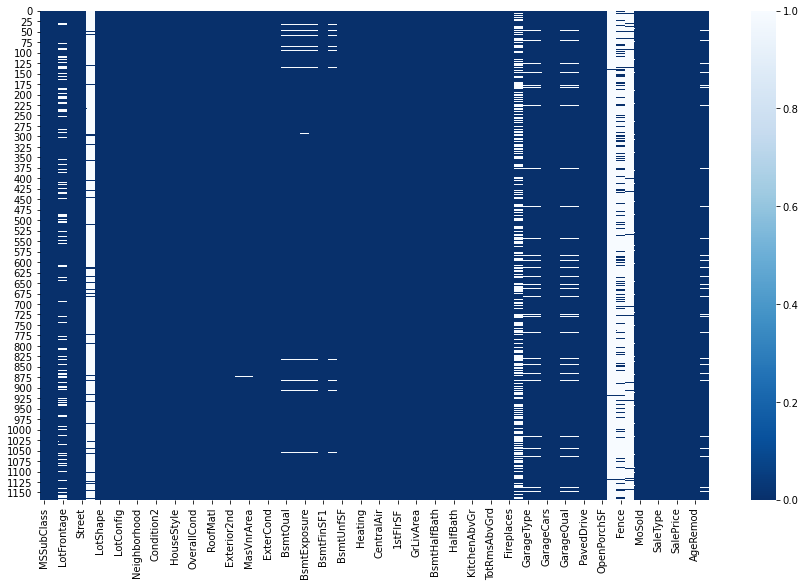

In [16]:
# Visualizing null values using heatmap
plt.figure(figsize=(15,9))
sns.heatmap(train_df.isnull(),cmap="Blues_r")
plt.show()

Here the white lines represents the null values in the dataset



In [17]:
#Dropping the columns containing more than 70% null values

train_df.drop(['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

# Treating null values
The colums LotFrontage, MasVnrArea and GarageYrBlt are numeric in nature, lets fill the null values using mean values as there are no outliers present in these columns.

The remaining columns seems to be categorical so filling the null values using mode method.

In [18]:
#Filling null values of object data columns with their mode values

col1=train_df.columns.values
for i in range(0,len(col1)):
    if train_df[col1[i]].dtype == 'object':
        train_df[col1[i]].fillna(train_df[col1[i]].mode()[0],inplace=True)

In [19]:
#filling the null values of Numerical data columns with their mean values

col2=train_df.columns.values
for i in range(0,len(col2)):
    if train_df[col2[i]].dtype != 'object':
        train_df[col2[i]].fillna(train_df[col2[i]].mean(),inplace=True)

In [20]:
#checking the null values after filling

train_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageFinish

And we have filled all the null values

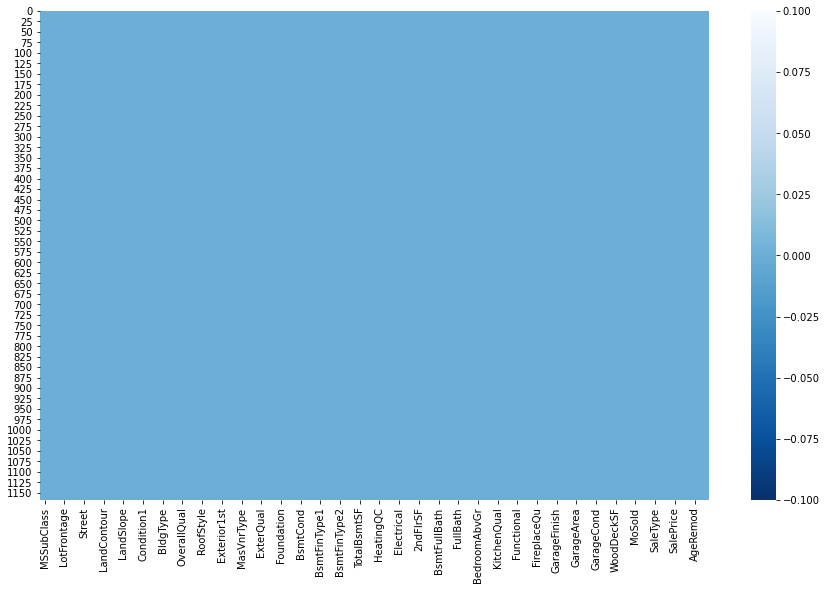

In [21]:
# Lets visualize the null values clearly
plt.figure(figsize=(15,9))
sns.heatmap(train_df.isnull(),cmap="Blues_r")
plt.show()

We can clearly visualize no null values in any of the columns.

In [22]:
# Checking the uniqueness of the target column
train_df['SalePrice'].unique()

array([128000, 268000, 269790, 190000, 215000, 219210, 121500, 155000,
       140000, 118500, 119500, 237000, 201000, 126500, 135500, 165000,
       120500, 194500, 148000, 106000, 231500, 133000, 142125, 136500,
       146000, 217000, 112000, 394432, 113000, 188700, 319900, 135000,
       128500, 169000, 122000, 152000, 243000, 156000,  79500, 132000,
       144152, 130000, 149900, 124500, 179000, 147000,  39300, 312500,
       256000,  60000, 153000,  84900, 230000, 180000, 106500, 239000,
       107500, 123000, 176000, 228500, 117500, 350000, 200624, 173000,
       225000,  84500, 174900,  79000, 297000,  87000, 465000, 204900,
       127000, 159000, 170000, 159500, 102000, 109500, 163990, 189950,
       119000, 157500, 287000, 144000, 286000, 172000, 212000, 124000,
       150000, 205950, 251000, 129000, 223500, 475000, 335000, 115000,
       205000, 209500, 176432, 171000, 302000, 259500, 141000, 187500,
       385000, 275000, 108000,  89500, 109900, 185000, 143000, 127500,
      

These are the unique values present in the target column.

In [23]:
# Checking the dimeansion of the dataset after feature engineering
train_df.shape

(1168, 68)

In [24]:
#making list to see numerical and categorical columns separately

#checking for categorical columns

categorical_col=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]=='object':
        categorical_col.append(i)
print('categorical columns are:''\n',categorical_col)
print('\n')

#checking for numerical columns
numerical_col=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i] != 'object':
        numerical_col.append(i)
print('Numerical columns are :''\n',numerical_col)

categorical columns are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns are :
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice', 'AgeBuilt', 'AgeRemod', 'AgeGarage']


# Statistical Analysis:


In [25]:
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice,AgeBuilt,AgeRemod,AgeGarage
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,2007.804795,181477.005993,36.874144,23.046233,29.608696
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,1.329738,79105.586863,30.193130,20.783486,24.247703
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,-1.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000,8.000000,4.000000,7.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,2008.000000,163995.000000,36.000000,14.000000,29.608696
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,2009.000000,215000.000000,54.000000,42.000000,46.250000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,2010.000000,755000.000000,135.000000,60.000000,107.000000


Remarks: In the above cell, we can see all the numeric value details and we can also see the spread of the data like the target "SalePrice" has min value of 34900 and max value of 755000. Count is not same for all the columns indicating that there are missing values present in the dataset.



# 2. Graphical EDA:


# Univariate Analysis

# COunt Plots

In [26]:
def value_count(column):
    counts=len(train_df[column].value_counts())
    if counts<3:
        plt.figure(figsize=(8,5))
    elif counts<5:
        plt.figure(figsize=(8,5))
    elif counts<10:
        plt.figure(figsize=(10,6))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=train_df,palette="Set2_r")
    plt.show()
    print("-"*125)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


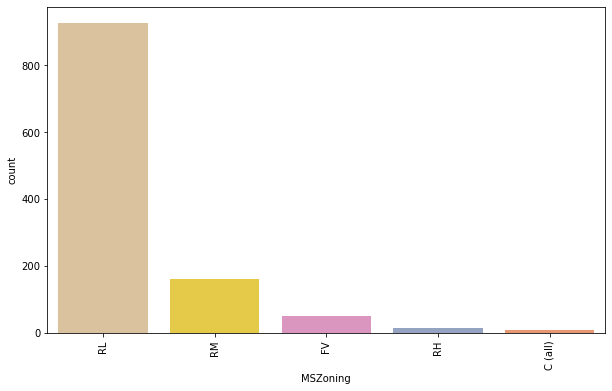

-----------------------------------------------------------------------------------------------------------------------------
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


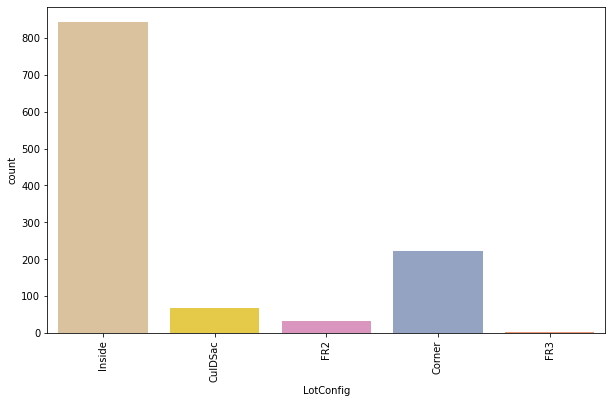

-----------------------------------------------------------------------------------------------------------------------------
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
ClearCr     24
Timber      24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


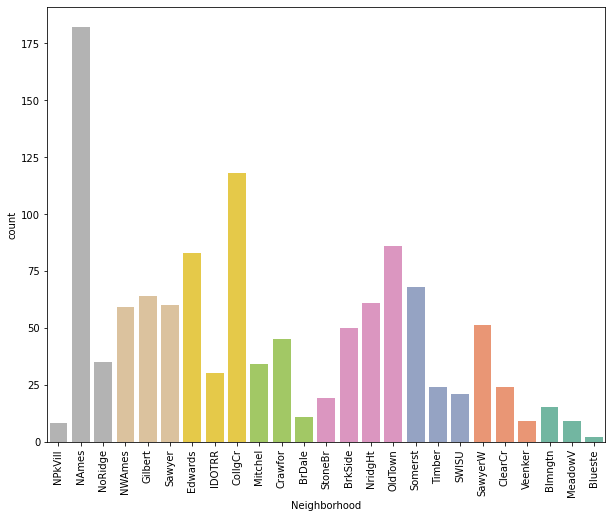

-----------------------------------------------------------------------------------------------------------------------------
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


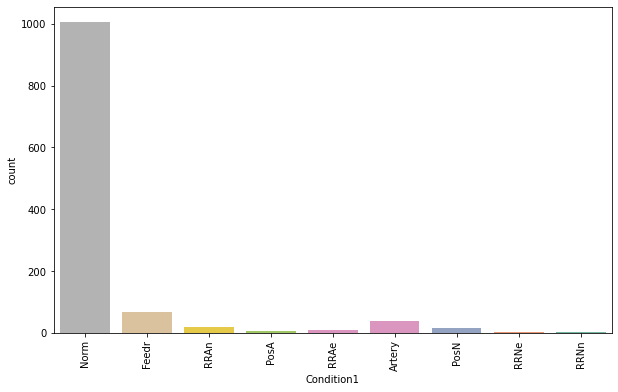

-----------------------------------------------------------------------------------------------------------------------------
Norm      1154
Feedr        6
PosN         2
Artery       2
RRNn         1
RRAn         1
PosA         1
RRAe         1
Name: Condition2, dtype: int64


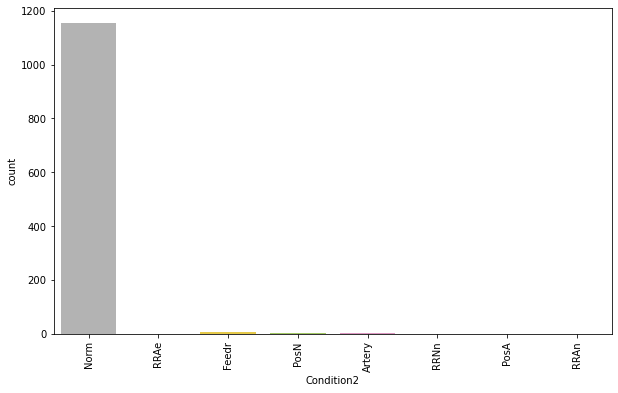

-----------------------------------------------------------------------------------------------------------------------------
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


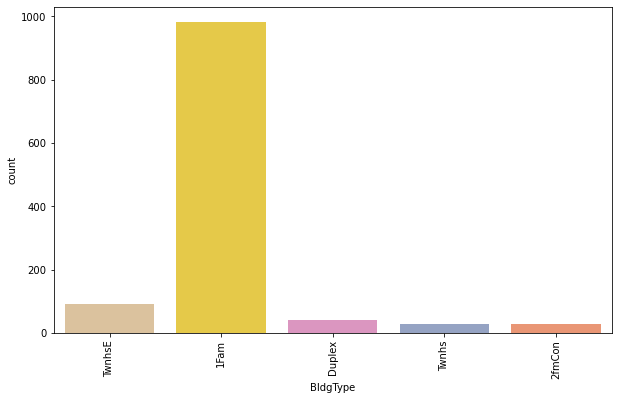

-----------------------------------------------------------------------------------------------------------------------------
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


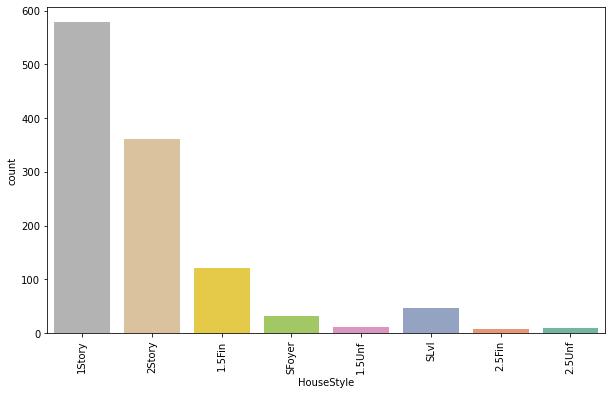

-----------------------------------------------------------------------------------------------------------------------------
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


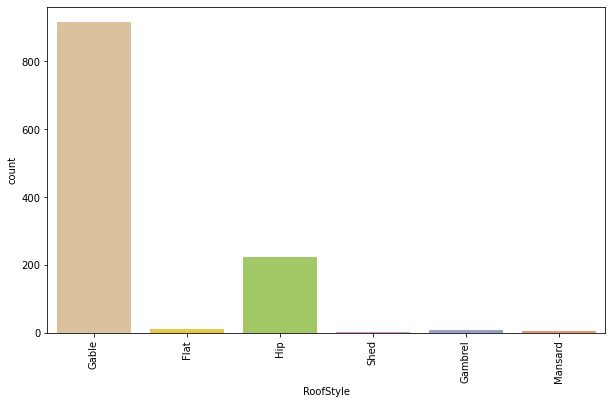

-----------------------------------------------------------------------------------------------------------------------------
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
Metal         1
Membran       1
ClyTile       1
Name: RoofMatl, dtype: int64


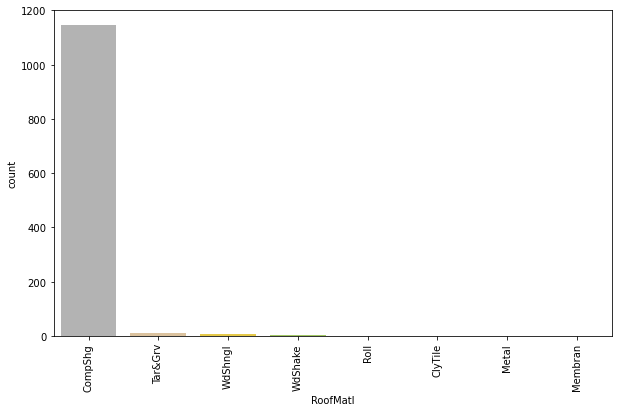

-----------------------------------------------------------------------------------------------------------------------------
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
BrkComm      1
ImStucc      1
Name: Exterior1st, dtype: int64


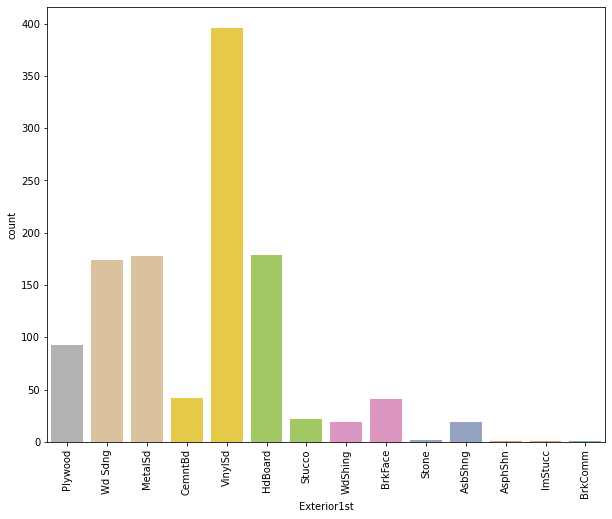

-----------------------------------------------------------------------------------------------------------------------------
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


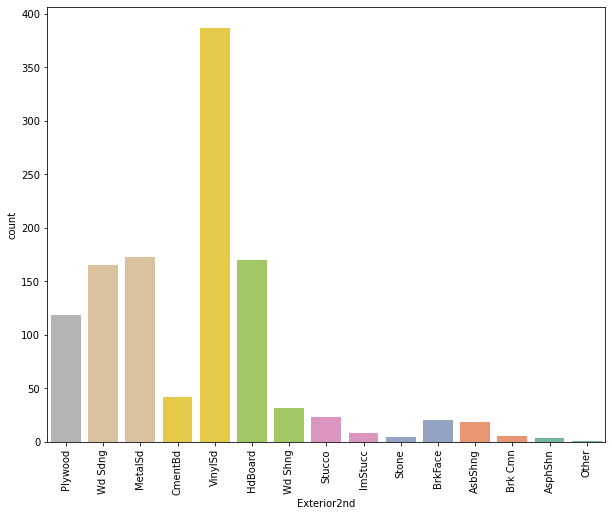

-----------------------------------------------------------------------------------------------------------------------------
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


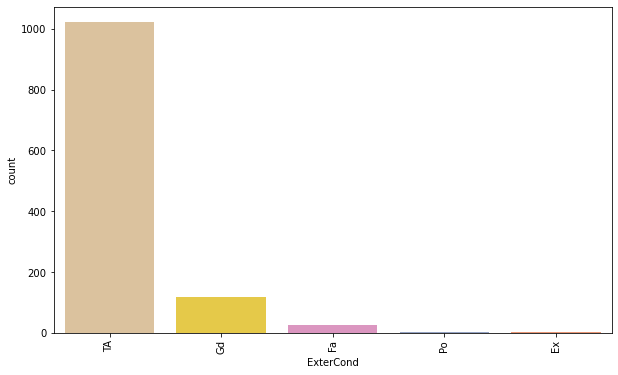

-----------------------------------------------------------------------------------------------------------------------------
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


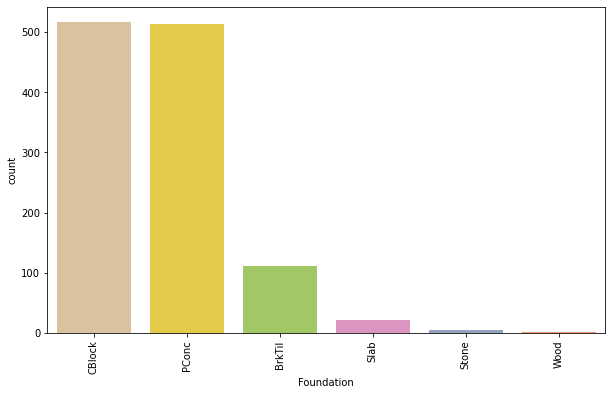

-----------------------------------------------------------------------------------------------------------------------------
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


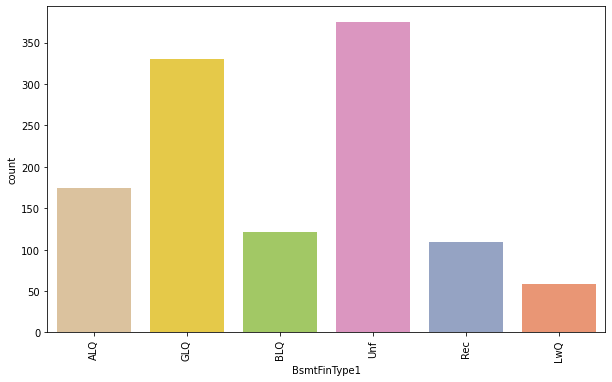

-----------------------------------------------------------------------------------------------------------------------------
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


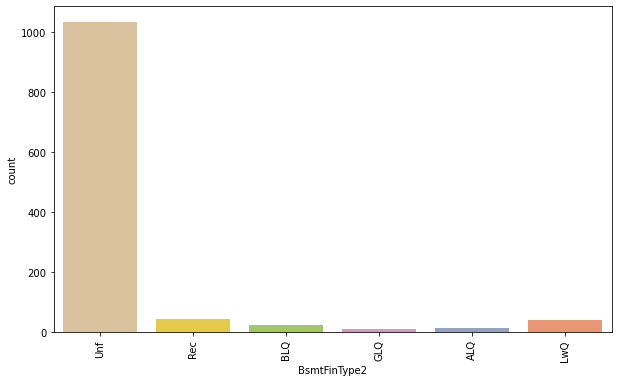

-----------------------------------------------------------------------------------------------------------------------------
GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64


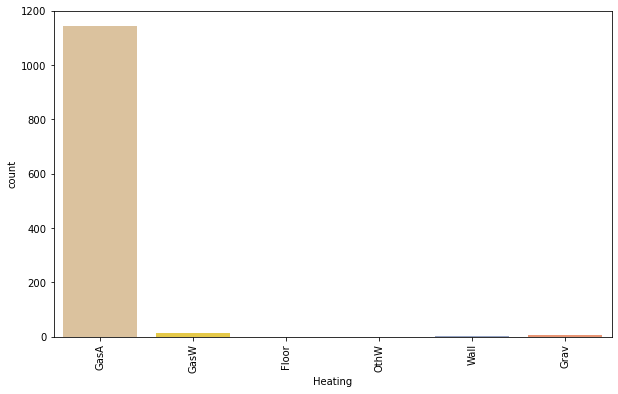

-----------------------------------------------------------------------------------------------------------------------------
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


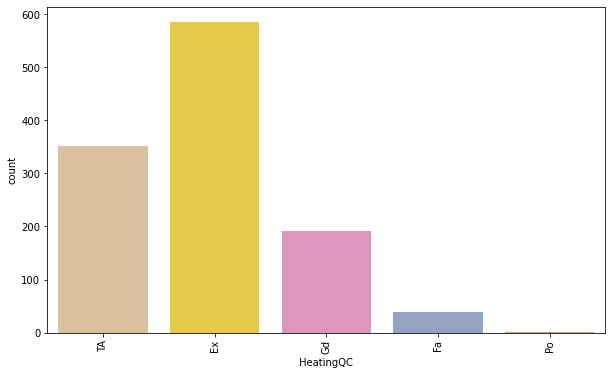

-----------------------------------------------------------------------------------------------------------------------------
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


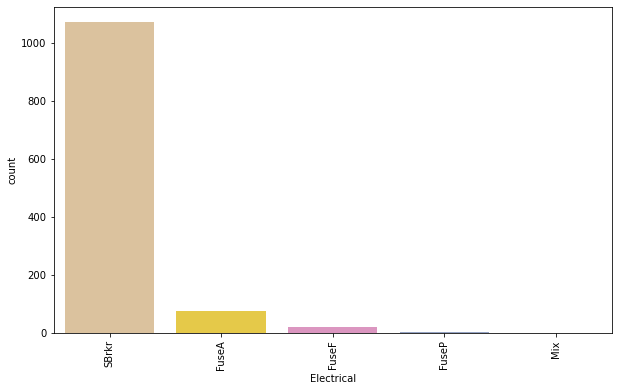

-----------------------------------------------------------------------------------------------------------------------------
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


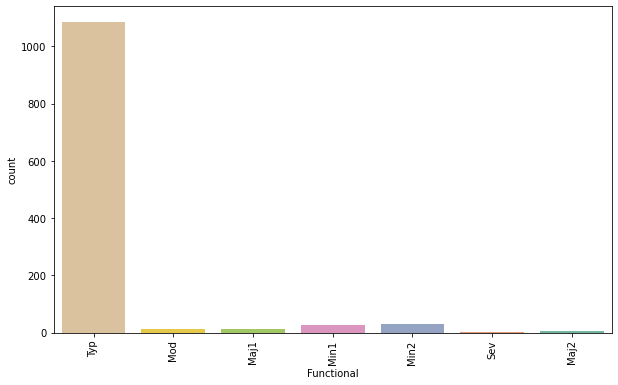

-----------------------------------------------------------------------------------------------------------------------------
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


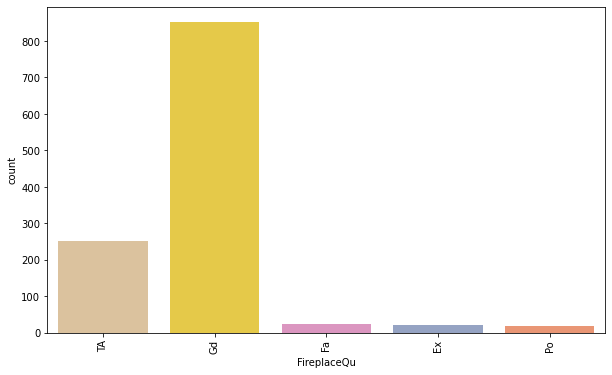

-----------------------------------------------------------------------------------------------------------------------------
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


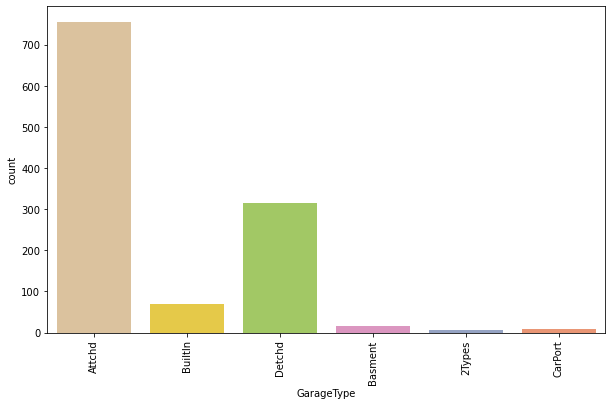

-----------------------------------------------------------------------------------------------------------------------------
TA    1114
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64


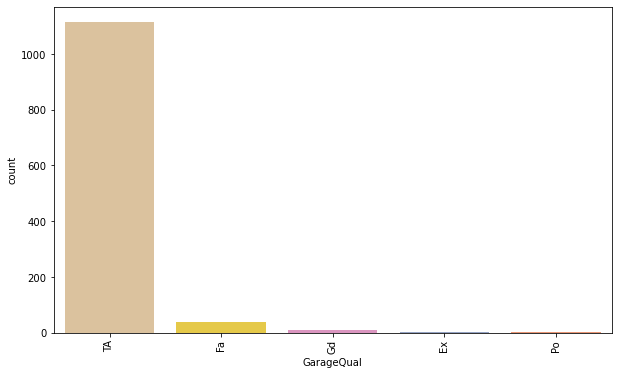

-----------------------------------------------------------------------------------------------------------------------------
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


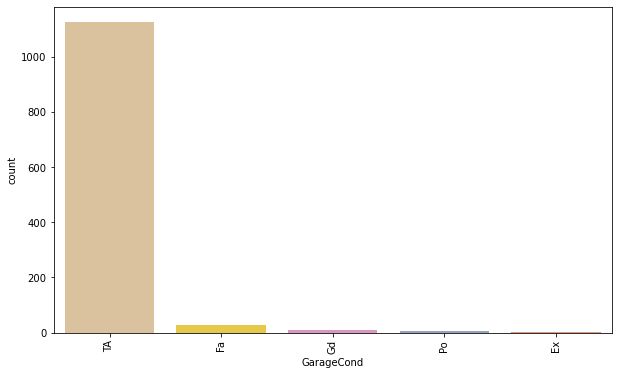

-----------------------------------------------------------------------------------------------------------------------------
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64


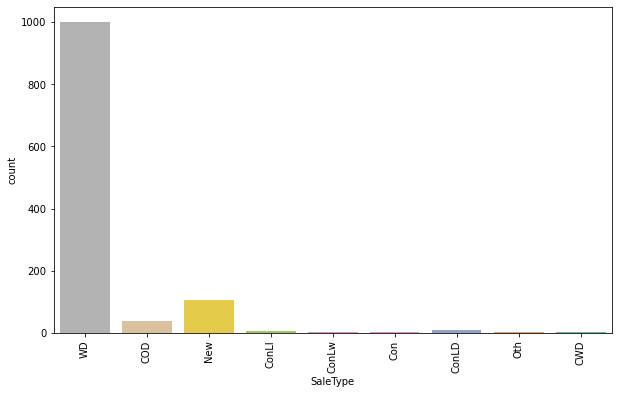

-----------------------------------------------------------------------------------------------------------------------------
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


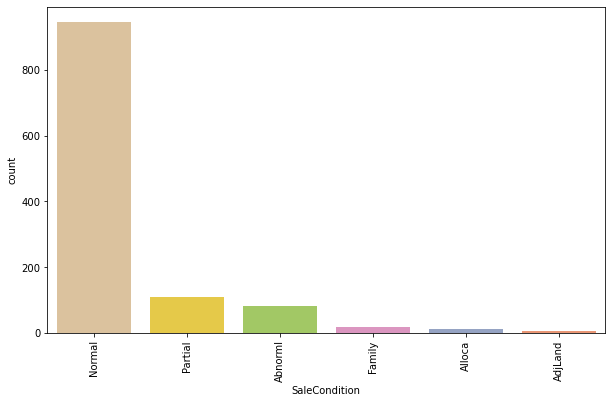

-----------------------------------------------------------------------------------------------------------------------------


In [27]:
df1 = train_df[['MSZoning','LotConfig',  'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',  'ExterCond', 'Foundation','BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',  'Electrical',  'Functional', 'FireplaceQu', 'GarageType',  'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']]
for i in df1:
    print(df1[i].value_counts())
    value_count(i)

# Observations:
. MSZoning: The houses having Residential Low Density zonong of the sale have high count and commercial zoning sale have very less count compared to others.

. LotConfig: Inside lot configuration has high count and Frontage on 3 sides of property have very less count compared to others.

. Neighbourhood: The count is high for the North Ames cities floowed by college creek and count is very low compared to others

. Condition1: The count is high for the Normal proximity condition apart from this all the others have veryh less count.

. Condition2: Similarly to condition1, in condition2 also Normal proximity has very high count compared to others.

. BldgType: Single family detached dweeling type has very high counts compared to other types.

. HouseStyle: 1 story style of dwelling has high count followed by 2 story and others have very less count.

. RoofStyle: The flat type roof has high count and shed has very less count.

. Exterior1st: Most of the houses have Vinyl Siding exterior covering materials followed by hard board also Brick Common, Asphalt Shingales and Imitation Stucco have very high count which means there are no more houses with these types.

. Exterior2nd: Similar to Exterior1st, here also most of the houses have Vinyl Siding exterior covering materials.

. ExterCond: The present condition of the material on the exterior for most of the houses are Average/Typical.

. Foundation: Most of the houses have Cinder Block and Poures Concrete type of foundation.


. BmstFinType: The count is high for the houses having unfinished basement area. Also some houses have Good Living Quarters.BmstFinType2:Similar to BmstFinType1, here also the count is high for unfinished basements.

. Heating: Most of the houses have Gas forced warm air furnace heating type.

. HeatingQC: Most of the houses have excellent heating quality and condition also some houses have typical/average HeatingQC and only 1% of the houses have poor heating quality and condition.

. Electrical: The electrical system of the type Standard Circuit Breakers & Romex has very high count which means most of the houses have this facility.

. Functional: The total number of home functionality of the property for typical functionality have high count compared to others.

. FireplaceQu: The houses with Masonry Fireplace in main level have good quality compared ot others.

. GarageType: The garage location attachec to home has high count also the garage locations detached to home have moderate level of counts. Only few houses have car port and more than one type of garage.

. GarageQual: Houses with typical/average garage quality have high count compared to others.

. GarageCond: Houses with typical/average garage condition have high count compared to others.

. SaleType: Warranty Deed type of sale has high count followed by Home just constructed and sold(new).

. SaleCondition: Mormal sale has high count also the home which was not completed when last assessed also has average sale condition.

# Pie plots:

pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


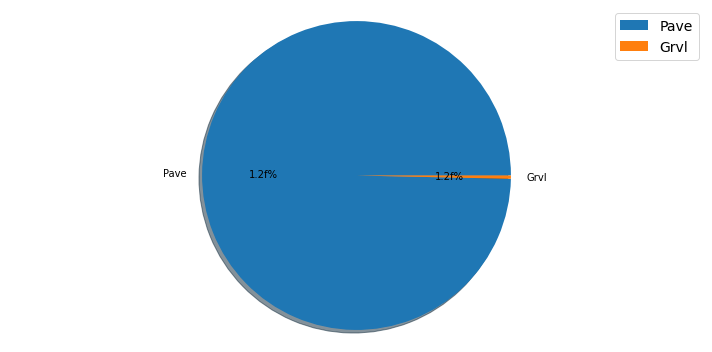

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


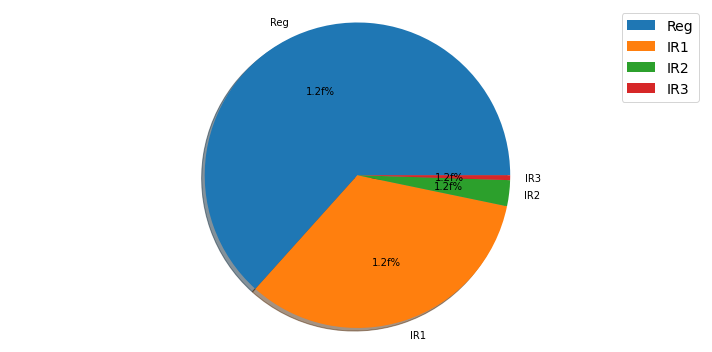

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


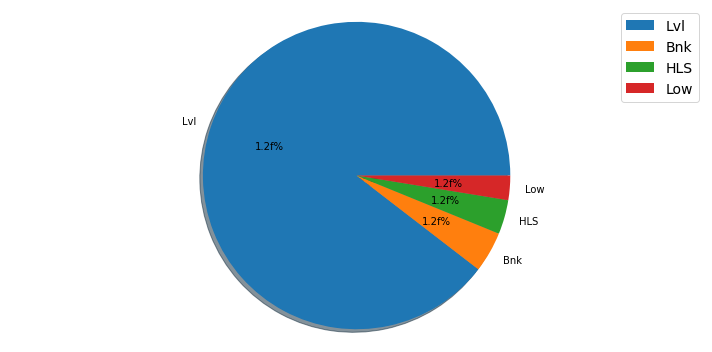

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


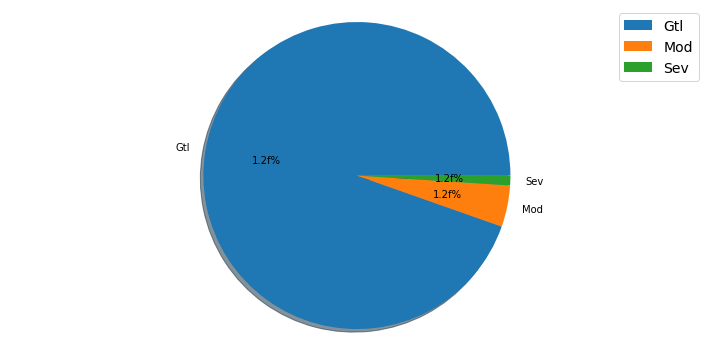

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


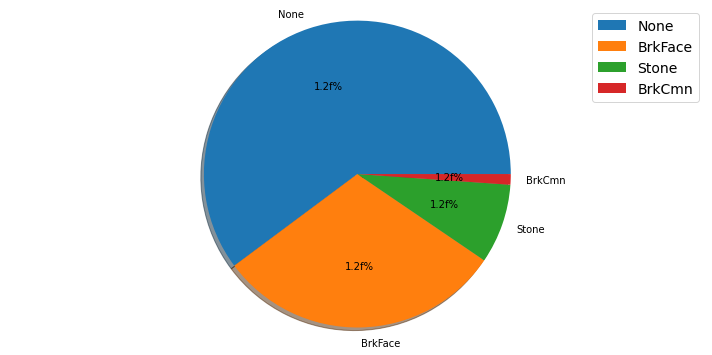

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


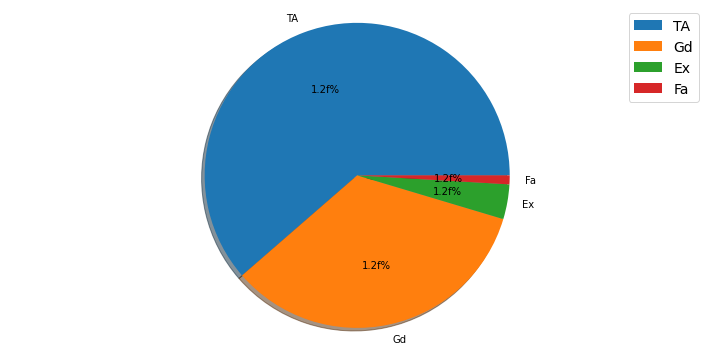

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


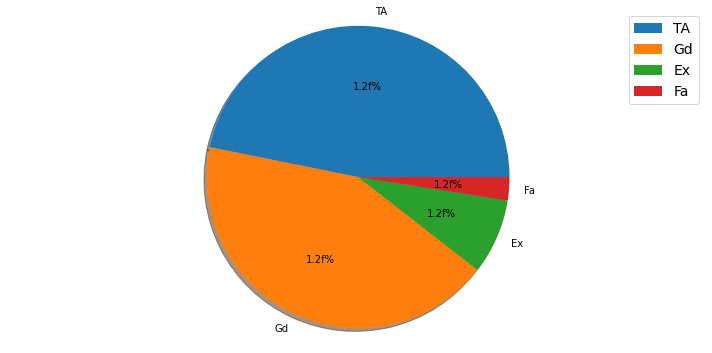

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


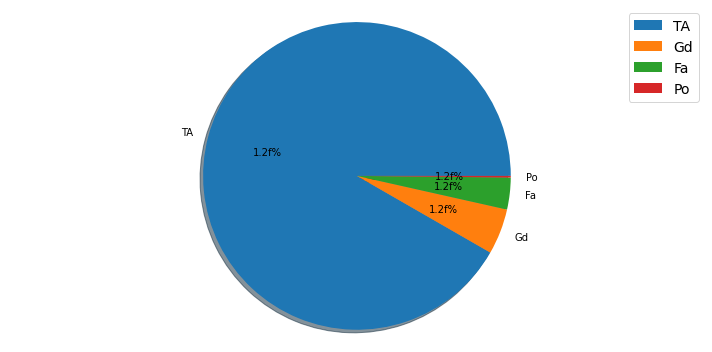

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


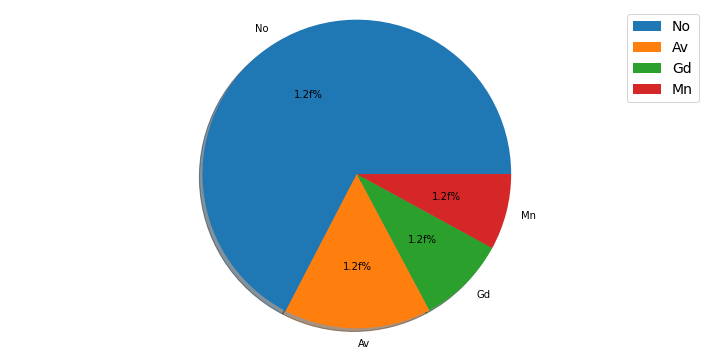

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


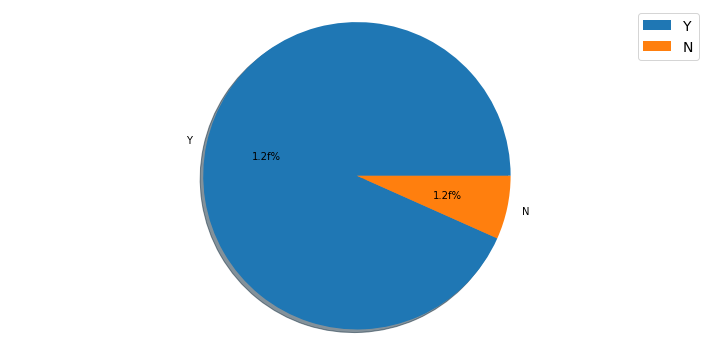

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


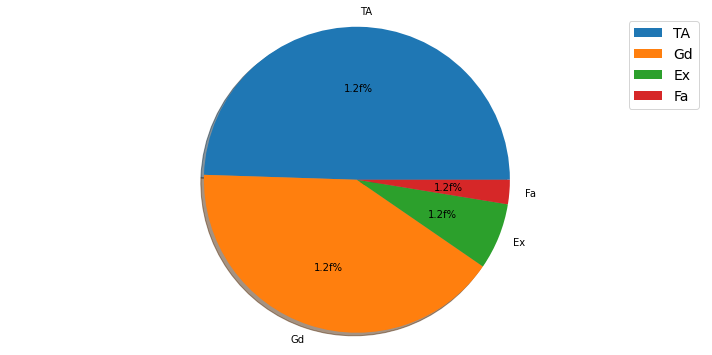

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


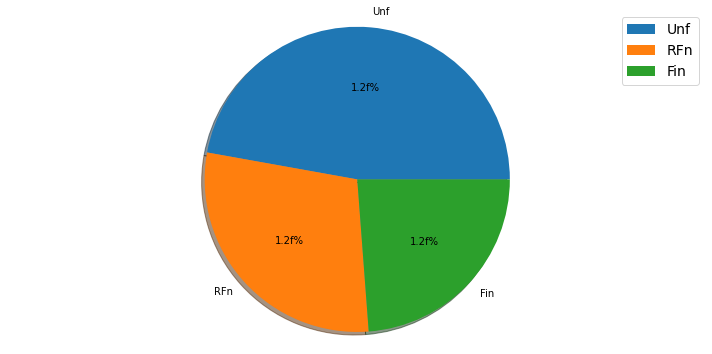

-----------------------------------------------------------------------------------------------------------------------------
pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


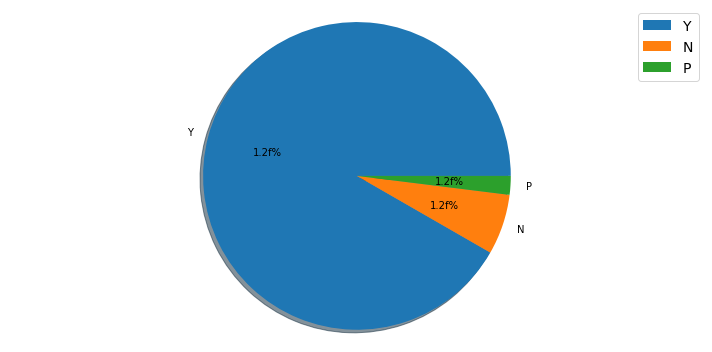

-----------------------------------------------------------------------------------------------------------------------------


In [28]:
def pie_plot(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(),labels=i.value_counts().index,autopct='1.2f%%',shadow=True)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['Street', 'LotShape','LandContour','LandSlope', 'MasVnrType','ExterQual','BsmtQual','BsmtCond','BsmtExposure','CentralAir','KitchenQual','GarageFinish','PavedDrive']

plotnumber=1
for j in train_df[cols1]:
    print(f"pie plot for the column:",j)
    print(train_df[j].value_counts())
    pie_plot(train_df[j])
    print("-"*125)

# Observations:
.Street: The count of road access to the property Paved is 1164 which covers around 99.66% of the property where Graved type has count 4 that is only 0.34%.

.LotShape: The count is high for the property having the shape regular followed by slightly regular and the count is less for irregular shape of property.

.LandContour: The total number of flatness of the property for level is high which has 89.55% and the others like banked, hillside and depression have very less flatness of area.

.LandSlope: The slope of the property Gentle slope has very high count of 1105 i.e, 94.61% and other types Moderate Slope and Severe Slope have very less count.

.MasVnrType: Around 60% of the houses does not have Masonry veneer type, 30% of the houses contains Brick Face type of Masonry veneer.

.ExterQual: Around 61% of the houses evaluates typical/average quality of the material on the exterior, 34% of the houses have good quality of the material on the exterior. Only few have excellent quality.

.BsmtQual: Most of the houses evaluates typical/average and good quality of heoght of the basement, only few of the houses have excellent quality.

.BsmtCond: Around 91% of the houses have typical/average condition of the basement and only 2 houses have poor condion.

.BsmtExposure: Around 67% of the houses does not contain any walkout or garden level walls and 7% of the houses have minimum exposure.

.CentralAir: 93.32% of the houses have central air conditioning and only 6.68% of houses do not have air conditioning.

.KitchenQual: 49% of the houses contains typical/average kitchen quality and 40% of the houses have good kutchen quality. The count for excellent kitchen quality is very low and is around 2%.

.GarageFinish: 47% Of the houses have unfinished garage interior, 29% rough finished and only 23% of the houses' interior garage has finished.

.PavedDrive: 91.70% of the houses contains the paved drive way.

# Distribution Of skewness

plotting the Numerical columns

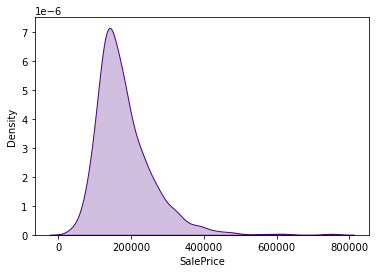

In [29]:
# Lets visualize the target variable SalePrice
plt.figure(figsize=(6,4))
sns.distplot(train_df['SalePrice'],color='indigo',kde_kws={'shade':True},hist=False)
plt.show()

The data in the target variable is almost normally distributed. The maximum alePrice of the house is around 200000.

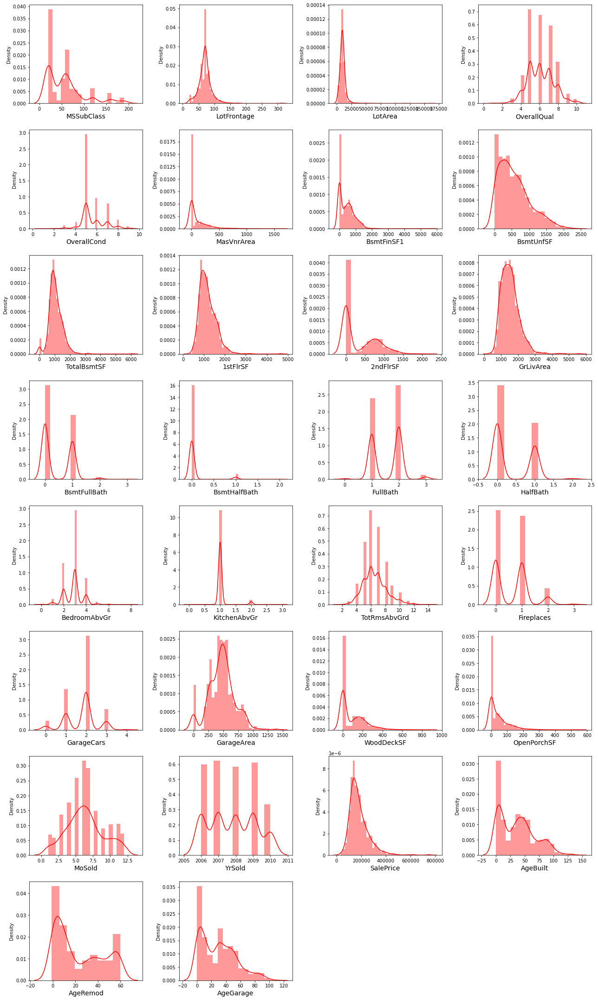

In [30]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="r")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

Almost all the columns have skewness and are skewed to the right since the mean is greater than the median in these columns.

# Bivariate Analysis


# Plotting Nominal Variables vs SalePrice

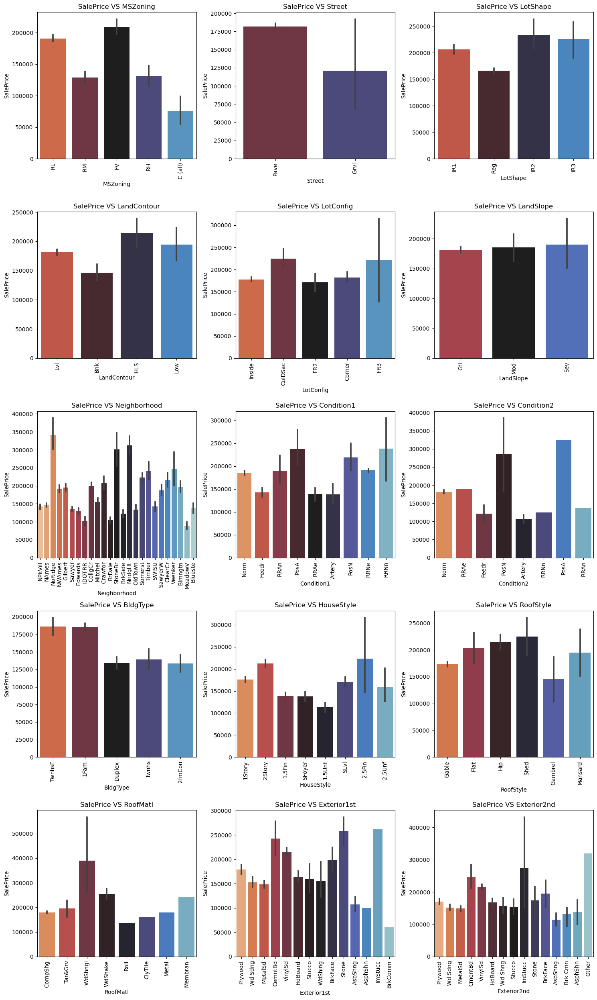

In [31]:
# Cheching relation between nominal categorical variables and target variable
nominal_data1 = ['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data1[i]],palette="icefire_r")
    plt.title(f"SalePrice VS {nominal_data1[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

# Observations:

.SalePrice vs MSZoning: Most of the houses are belongs to Floating Village Residential followed by Residential Low Density. The houses from this zone are have high saleprice compared to other zones.

.SalePrice vs Street: By observing the bar plot, it is obvious that the property of house with Paved type of road have high SalePrice and the the houses in gravel roads have very less sale price.

.SalePrice vs LotShape: Most of the houses having moderately irregular and irregular shape of property have high sale price and houses with regullar type of property have less sale peice compared to others.

.SalePrice vs LandContour: The houses having the hillside and depression property flatness have high sale price compared to others.

.SalePrice vs LotConfig: Most of the houses with Frontage on 3 sides of property have high sale price compared to others.

.SalePrice vs LandSlope: There is no significance difference between the slope of the property. As we can observe the houses having Gentle slope, Moderate Slope and Severe Slope have same sale price.

.SalePrice vs Neighborhood: The houses which are located near Northridge have high sale price compared to others.

.SalePrice vs Condition1: The houses having the conditions adjacent to postive off-site feature and houses within 200' of North-South Railroad have high sale price compared to others.

.SalePrice vs Condition2: The houses having the conditions near positive off-site feature park, greenbelt, etc and adjacent to postive off-site feature have high sale price.

.SalePrice vs BldgType: Most of the houses are Single-family Detached and Townhouse End Unit and they have higher sale price compared to other categories.

.SalePrice vs HouseStyle: Houses which are having style of dwelling 2nd level finished and Two story have high sale price compared to other types.

.SalePrice vs RoofStyle: The houses having the roof style Flat, Hip and Shed have high sale price and the houses having gabrel roof style have less sale price.

.SalePrice vs RoofMatl: Houses with Wood Shingles root materials have high sale prices.

.SalePrice vs Exterior1st: Houses having Imitation Stucco, Stone and Cement Board as 1st exterior cover have high sale price.

.SalePrice vs Exterior2nd: Houses having Imitation Stucco and other as 2nd cover have high sale price.

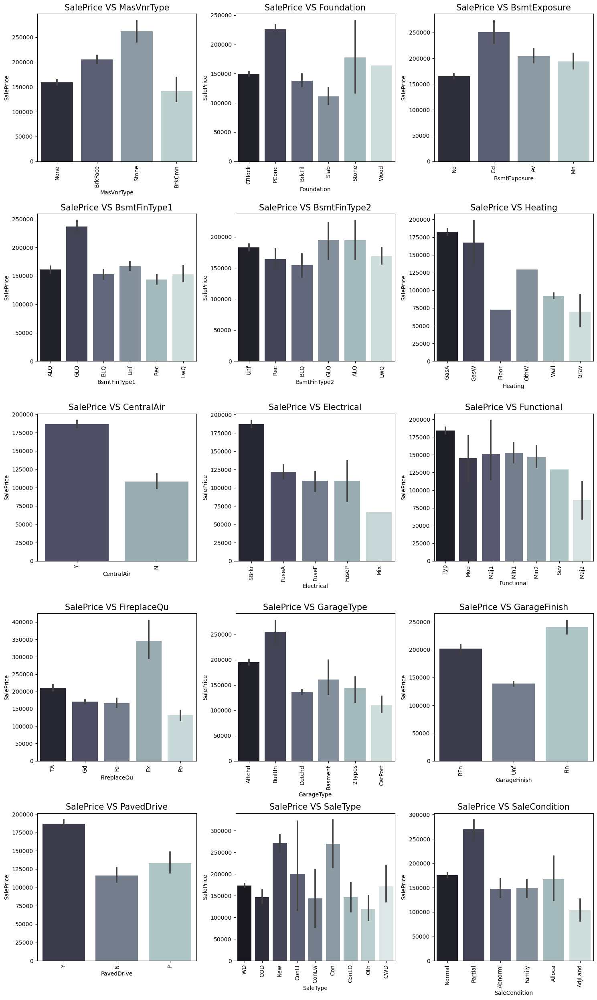

In [32]:
# Checking relation between nominal categorical variables and target variable
nominal_data2 = ['MasVnrType','Foundation','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','CentralAir','Electrical','Functional','FireplaceQu','GarageType','GarageFinish','PavedDrive','SaleType','SaleCondition']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data2)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data2[i]],palette="bone")
    plt.title(f"SalePrice VS {nominal_data2[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

# Observations:

.SalePrice vs MasVnrType: Houses having Stone Masonry veneer type have high sale price than other types.

.SalePrice vs Foundation: Houses having Poured Contrete as foundation type have high sale price compared to other types.

.SalePrice vs BsmtExposure: Houses having good walkout or garden level walls have high sale price compared to others.

.SalePrice vs BsmtFinType1: The sale price is high for the houses containing good living quarters basement finished area.

.SalePrice vs BsmtFinType2: The sale price is moderately high for the houses having good living quarters and average living quarters.

.SalePrice vs Heating: The houses having the heating type gas forced warm air furnace and gas hot water or steam heat have high sale price.

.SalePrice vs CentralAir: Most of the houses have central air conditioning so it is obvious that these houses have high sale price.

.SalePrice vs Electrical: Most of the houses having standard circuit breakers & romex have high sale price compared to others.

.SalePrice vs Functional: The houses having the typical functionality have maximum sales price and others have average sale price.

.SalePrice vs FireplaceQu: The houses having excellent exceptional masonry fireplace quality have high sale price and the houses having poor fireplace quality have very less sale price compared to others.

.SalePrice vs GarageType: The houses having built-in garage have high sale price compared to others.

.SalePrice vs GarageFinish: Garages located inside the house which is got finished have high sale price.

.SalePrice vs PavedDrive: Houses having paved drive ways have high sale price.

.SalePrice vs SaleType: Many houses having sale types as just constructed and sold and Contract 15% Down payment regular terms have high sale price.

.SalePrice vs SaleCondition: Houses having partial sale condition that is home was not completed when last assessed have high sale price.

# Multivariate Analysis


In [33]:
sns.pairplot(train_df,palette='husl')

.This pairplot gives the pairwise relation betweeen the columns which is plotted on the basis of target variable "SalePrice". Here we can observe the relation between the features and the label.

.Here we can observe the correlation between the features and on the diagonal we can notice the distribution plot which shows whether the columns has skewness or not.

.We can also see the linear relation between the features.`

# Identifying outliers

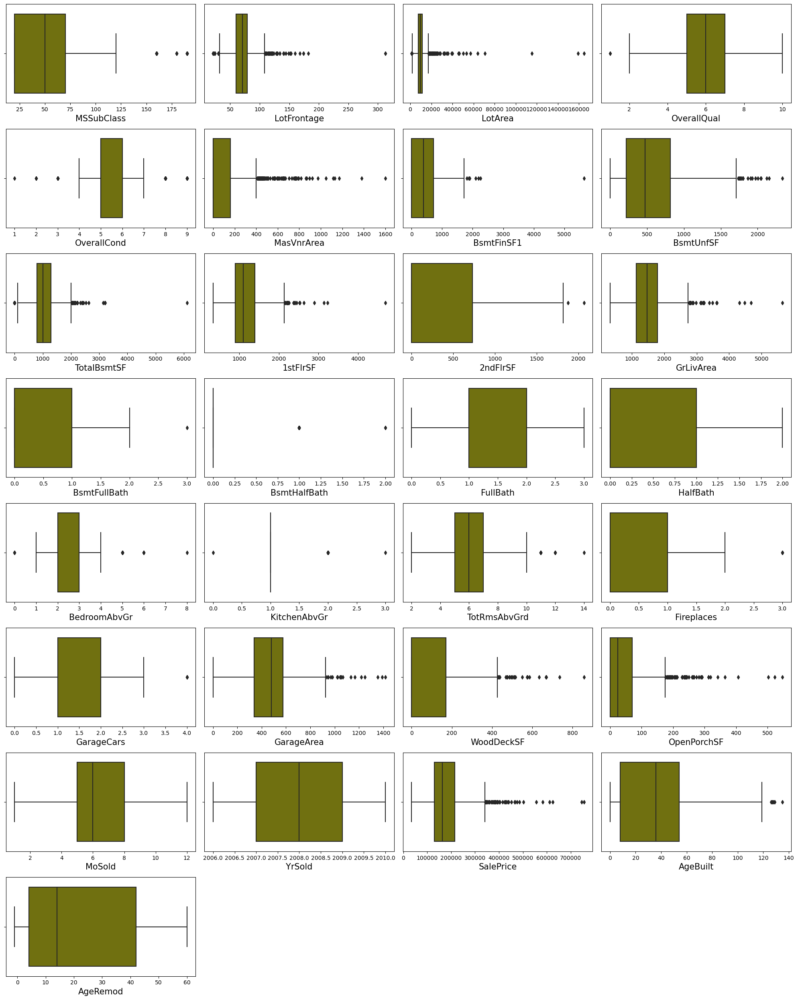

In [34]:
#Identifying outliers usinf the boxplot
plt.figure(figsize=(20,25),facecolor="white")
plotnumber=1
for col in numerical_col:
    if plotnumber<=29:
        ax = plt.subplot(8,4,plotnumber)
        sns.boxplot(train_df[col],color="olive")
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()

All the columns contains outliers except FullBath, HalfBath, MoSold and YrSold.

The columns OverallQual and OverallCond are categorical columns, also 'SalePrice' is the target variable, so we eill not remove outliers from these columns.

# Removing Outliers


# Zscore method

In [35]:
#Features containg outliers
features = train_df[['MSSubClass','LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1','BsmtHalfBath', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']]
from scipy.stats import zscore
z=np.abs(zscore(features))
z

array([[1.50830058, 0.        , 0.62061571, ..., 0.17194382, 0.76290677,
        2.38785016],
       [0.87704243, 1.07063136, 0.60090318, ..., 0.67237129, 0.12058474,
        2.41799216],
       [0.07709478, 0.93686671, 0.06307504, ..., 0.10197295, 0.66447551,
        1.25752521],
       ...,
       [2.46243779, 2.09513215, 0.91636244, ..., 0.17194382, 0.07300534,
        0.70170469],
       [0.31562908, 0.93583847, 0.22167034, ..., 1.05824144, 0.76290677,
        0.11212927],
       [0.07709478, 0.        , 0.29303823, ..., 0.39118586, 0.03008339,
        0.42862025]])

In [36]:
# Creating new dataframe
new_train_df = train_df[(z<3).all(axis=1)]
new_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,2007,WD,Normal,128000,31,31,30.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,2007,WD,Normal,268000,37,37,37.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,2007,WD,Normal,269790,11,10,10.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,2010,COD,Normal,190000,33,33,33.0
5,60,RL,58.00000,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,879,879,GasA,Ex,Y,SBrkr,879,984,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,660,TA,TA,Y,100,17,11,2006,New,Partial,219210,0,0,0.0


This is the new dataframe after removing the outliers.

In [37]:
#checking the Dimension of both dataframe
print(train_df.shape)
print(new_train_df.shape)

(1168, 68)
(949, 68)


In [38]:
#checking the loss 
loss = (1168-949)/1168*100
loss

18.75

By zscore the data loss is around 18%.

By using Zscore the data loss is in large amount, so lets use the percentile method by setting dataloss to 2%

# Percentile Method

In [39]:
#Removing the Outliers using the percentile Method
for col in features:
    if train_df[col].dtype !='object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]

Removing Outliers using precentile method


# Checking the Skewness

In [25]:
train_df.skew()

Id                0.026526
MSSubClass        1.422019
LotFrontage       0.188060
LotArea           1.191912
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
MasVnrArea        1.873138
BsmtFinSF1        0.639523
BsmtFinSF2        4.365829
BsmtUnfSF         0.777624
TotalBsmtSF       0.166773
1stFlrSF          0.645842
2ndFlrSF          0.717390
LowQualFinSF      8.666142
GrLivArea         0.592755
BsmtFullBath      0.355224
BsmtHalfBath      3.954345
FullBath          0.057809
HalfBath          0.656492
BedroomAbvGr     -0.145762
KitchenAbvGr      4.374289
TotRmsAbvGrd      0.443931
Fireplaces        0.552677
GarageYrBlt      -0.662934
GarageCars       -0.434745
GarageArea       -0.135675
WoodDeckSF        1.053617
OpenPorchSF       1.513678
EnclosedPorch     3.043610
3SsnPorch         9.770611
ScreenPorch       4.105741
PoolArea         13.243711
MiscVal          23.065943
MoSold            0.220979
YrSold            0.115765
S

The following features contains skewness more than +0.5 and -0.5.
* MSSubClass
* LotArea
* OverallCond
* MasVnrArea
* BsmtHalfBath
* BsmtUnfSF
* 2ndFlrSF
* GrLivArea
* KitchenAbvGr
* HalfBath
* Fireplaces
* WoodDeckSF
* OpenPorchSF
* SalePrice        
* AgeGarage

As Since OverallCond is categorical and SalePrice is label, so no need to remove skewness in these columns. Let's remove skewenss present in the remaining columns.

# Removing the skewness using the yeo-johnshon method

In [40]:
skew1 = ["MSSubClass","LotArea","MasVnrArea","BsmtHalfBath","BsmtUnfSF","2ndFlrSF","GrLivArea","KitchenAbvGr","HalfBath","Fireplaces","WoodDeckSF","OpenPorchSF"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')


In [41]:
train_df[skew1] = scaler.fit_transform(train_df[skew1].values)
train_df[skew1].head()

,MSSubClass,LotArea,MasVnrArea,BsmtHalfBath,BsmtUnfSF,2ndFlrSF,GrLivArea,KitchenAbvGr,HalfBath,Fireplaces,WoodDeckSF,OpenPorchSF
0,1.370435,-1.306083,-0.822896,-0.238775,0.916764,-0.871789,-1.281768,0.0,-0.782707,0.779453,-0.960144,1.423871
1,-1.167999,1.356458,-0.822896,-0.238775,1.042594,-0.871789,1.377184,0.0,-0.782707,0.779453,0.783831,1.428474
2,0.490047,0.113089,-0.822896,-0.238775,-0.510359,1.177246,1.060650,0.0,1.268421,0.779453,1.047285,1.208580
3,-1.167999,0.530989,1.385487,-0.238775,1.178365,-0.871789,0.775546,0.0,-0.782707,0.779453,-0.960144,1.178672
4,-1.167999,1.497522,1.140684,4.188040,-0.230032,-0.871789,0.322952,0.0,-0.782707,0.779453,1.139237,-1.062308


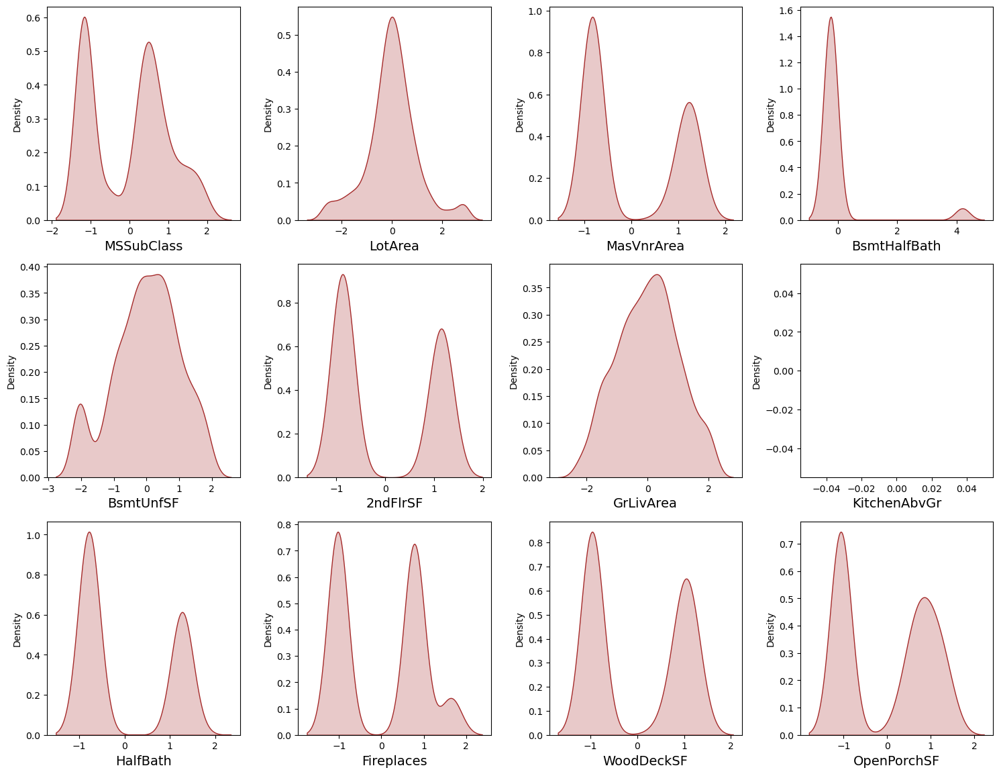

In [42]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in train_df[skew1]:
    if plotnumber<=14:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(train_df[column],color="brown",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [43]:
# Checking skewness after using yeo-johnson method
train_df[skew1].skew()

MSSubClass      0.064007
LotArea         0.077861
MasVnrArea      0.415092
BsmtHalfBath    3.954345
BsmtUnfSF      -0.304290
2ndFlrSF        0.279883
GrLivArea      -0.005974
KitchenAbvGr    0.000000
HalfBath        0.498003
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
dtype: float64

* We can observe that the skeweness has been removed in almost all the columns.
* The column KitchenAbvGr has skewness zero which means it contains only one unique value that is zero throughout the dataset, So lets can drop this column.
* There is skewness present in BsmtFinSF2 and EnclosedPorch.Lets remove the skewness from these columns using log transformation.

In [44]:
# Dropping irrelevant column
train_df.drop("KitchenAbvGr",axis=1,inplace=True)

# Encoding Categorical variables

In [45]:
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    train_df[i] = train_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [46]:
# Encoding train dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in train_df.columns:
    if train_df[i].dtypes == "object":
        train_df[i] = enc.fit_transform(train_df[i].values.reshape(-1,1))

In [47]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,3.0,70.98847,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1.0,1.0,8.0,9.0,2.0,-0.822896,3,3,1.0,4,3,3.0,0.0,120.0,5.0,0.916764,1078.00,1.0,3,1.0,4.0,958.00,-0.871789,-1.281768,0,-0.238775,2,-0.782707,2.0,3,5.0,6.0,0.779453,3,1.0,1.0,2,440.0,3,3,2.0,-0.960144,1.423871,2,2007,8.0,4.0,128000,31,31,30.0
1,-1.167999,3.0,95.00000,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,0.0,5.0,12.0,13.0,2.0,-0.822896,4,4,2.0,3,4,1.0,0.0,351.0,4.0,1.042594,2025.14,1.0,5,1.0,4.0,2092.58,-0.871789,1.377184,1,-0.238775,2,-0.782707,4.0,4,8.0,6.0,0.779453,3,1.0,2.0,2,621.0,3,3,2.0,0.783831,1.428474,10,2007,8.0,4.0,268000,37,37,37.0
2,0.490047,3.0,92.00000,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,7.0,7.0,2.0,-0.822896,4,3,2.0,4,3,0.0,2.0,862.0,5.0,-0.510359,1117.00,1.0,5,1.0,4.0,1127.00,1.177246,1.060650,1,-0.238775,2,1.268421,3.0,3,8.0,6.0,0.779453,3,1.0,2.0,2,455.0,3,3,2.0,1.047285,1.208580,6,2007,8.0,4.0,269790,11,10,10.0
3,-1.167999,3.0,105.00000,0.530989,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,3.0,1.0,8.0,9.0,1.0,1.385487,3,3,1.0,4,3,3.0,1.0,705.0,5.0,1.178365,1844.00,1.0,5,1.0,4.0,1844.00,-0.871789,0.775546,0,-0.238775,2,-0.782707,3.0,3,7.0,6.0,0.779453,3,1.0,1.0,2,546.0,3,3,2.0,-0.960144,1.178672,1,2010,0.0,4.0,190000,33,33,33.0
4,-1.167999,3.0,70.98847,1.497522,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1.0,1.0,4.0,4.0,3.0,1.140684,4,3,1.0,4,3,3.0,0.0,1246.0,5.0,-0.230032,1602.00,1.0,4,1.0,4.0,1602.00,-0.871789,0.322952,0,4.188040,2,-0.782707,3.0,4,8.0,6.0,0.779453,3,1.0,0.0,2,529.0,3,3,2.0,1.139237,-1.062308,6,2009,8.0,4.0,215000,32,9,32.0


# Correlation between Features and label

In [48]:
# Checking the correlation between features and the target
cor = train_df.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.026898,-0.316274,-0.312939,-0.017924,0.067516,-0.030467,0.057130,-0.016595,-0.011619,-0.039101,-0.031881,0.586409,0.481353,0.122241,-0.033927,-0.138069,-0.028166,-0.048778,-0.069930,-0.028288,0.004875,0.062077,-0.031109,0.048143,0.076728,-0.006384,-0.060011,0.084234,-0.111364,0.056615,-0.116225,-0.293377,0.071533,0.018161,-0.111572,0.036332,-0.298382,0.558561,0.230677,-0.067705,0.010020,0.197635,0.295003,0.078793,0.048228,0.192707,0.037758,0.029802,-0.004202,0.104343,-0.023714,0.000675,-0.075152,-0.003808,-0.045967,-0.086870,0.038922,0.062935,0.010865,-0.042020,0.064683,-0.027825,-0.001252,0.012605,-0.055151,-0.050194
MSZoning,0.026898,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.037414,0.021518,-0.037280,-0.031322,-0.032954,-0.065060,0.051188,-0.149446,-0.015887,-0.079205,-0.035441,-0.016193,-0.086858,-0.009900,0.006809,-0.188837,-0.125164,-0.000610,-0.133170,-0.024508,-0.091684,0.009349,-0.011942,0.125155,0.162566,-0.130963,-0.163414,-0.095053,-0.073200,-0.077280,0.006946,-0.182359,-0.051646,-0.004964,0.079854,0.004501,-0.133221,0.299038,0.174282,0.260475
LotFrontage,-0.316274,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,-0.022579,0.011970,-0.467073,0.057902,0.230687,-0.051887,0.168101,0.063294,0.079942,0.108934,-0.066054,0.166180,0.158712,-0.001004,0.090652,0.163680,0.047333,-0.121117,-0.028977,0.141131,-0.015941,0.130111,0.318263,-0.036713,0.084699,0.087970,0.073880,0.374209,-0.036998,0.318133,0.070859,0.011408,0.180823,0.049731,0.278173,0.158665,0.323070,0.037977,0.227523,-0.059379,-0.243693,-0.202471,0.297190,0.334422,0.053380,0.039626,0.106891,0.065003,0.168784,0.027718,-0.005074,-0.040647,0.076587,0.358470,-0.123163,-0.081202,-0.062017
LotArea,-0.312939,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,0.097839,0.070513,0.009319,0.116129,0.047736,-0.144857,-0.043423,0.201494,-0.073788,0.052521,0.332367,-0.021160,0.047385,0.073866,0.053827,0.438908,0.009290,0.397820,0.108691,0.043299,0.187219,0.061575,0.297515,0.127004,0.369388,-0.025038,0.328380,-0.096589,-0.201895,-0.155464,0.272560,0.319552,0.060260,0.030388,0.041033,0.125098,0.146222,0.021311,-0.039843,-0.022130,0.046115,0.394343,-0.025054,-0.031184,0.020762
Street,-0.017924,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.091807,-0.028096,0.032701,0.027107,0.002199,0.065253,-0.006420,-0.010957,0.045208,0.030988,0.016841,0.006981,0.038560,0.043024,0.038720,0.011318,0.026241,0.052837,-0.010398,0.013997,0.033208,0.045883,0.028722,0.068306,0.039782,-0.015309,0.021069,-0.027427,-0.000824,-0.001178,0.001838,-0.002976,-0.005942,-0.006471,0.041318,0.022918,0.017900,-0.008860,-0.019635,0.025920,0.014176,0.044753,-0.021125,-0.059127,-0.015826
LotShape,0.067516,0.053655,-0.157341,-0.287003,-0.012941,1.000000,0.081803,0.21

This gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map

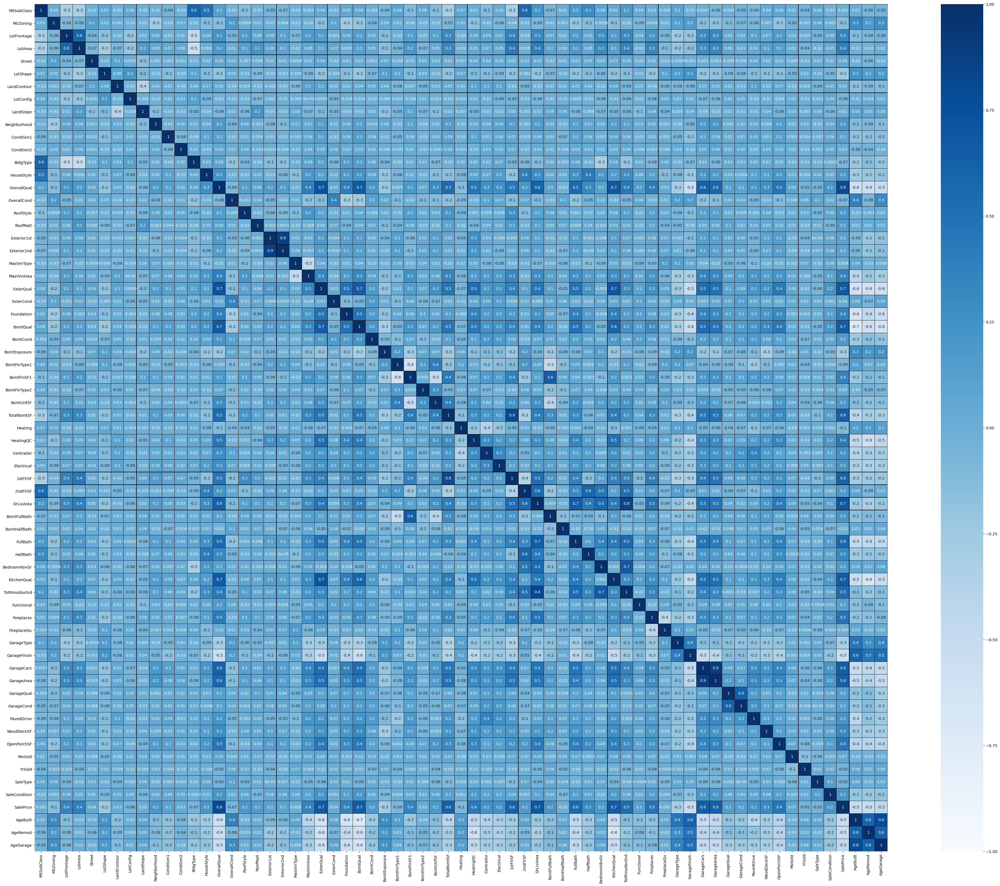

In [49]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(50,40))    
sns.heatmap(train_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="Blues")
plt.yticks(rotation=0);

* This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between one feature to other.
* Dark shades are positively correlated with the label and light shades are negatively correlated with the label SalePrice.

# Important features that affect SalePrice positively and negatively

### Features having high Negative correlation with label

* Heating
* MSZoning
* LotShape
* BsmtExposure
* GarageType
* AgeRemod
* AgeGarage
* AgeBuilt
* GarageFinish

* From the heat map it can be seen that most of the features are correlated with each other which means multicollinearity problem. This problem may impact our models.

Let's check the correlation between feature and label.



In [50]:
cor['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.688210
ExterQual        0.672665
KitchenQual      0.659228
BsmtQual         0.653265
GarageCars       0.634573
GarageArea       0.627504
TotalBsmtSF      0.624311
1stFlrSF         0.604380
FullBath         0.554988
TotRmsAbvGrd     0.528564
Fireplaces       0.475531
OpenPorchSF      0.449961
HeatingQC        0.431516
LotArea          0.394343
Foundation       0.374169
MasVnrArea       0.373364
BsmtFinSF1       0.366791
LotFrontage      0.358470
WoodDeckSF       0.310128
HalfBath         0.309808
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
BsmtFullBath     0.218620
SaleCondition    0.217687
HouseStyle       0.205502
Neighborhood     0.198942
BsmtUnfSF        0.193140
RoofStyle        0.192654
BsmtCond         0.181625
BedroomAbvGr     0.177452
2ndFlrSF         0.167816
RoofMatl         0.159865
GarageQual       0.147272
GarageCond       0.119962
Functional       0.118673
Exterior1st 

# Visualizing the correlation between label and features using bar plot

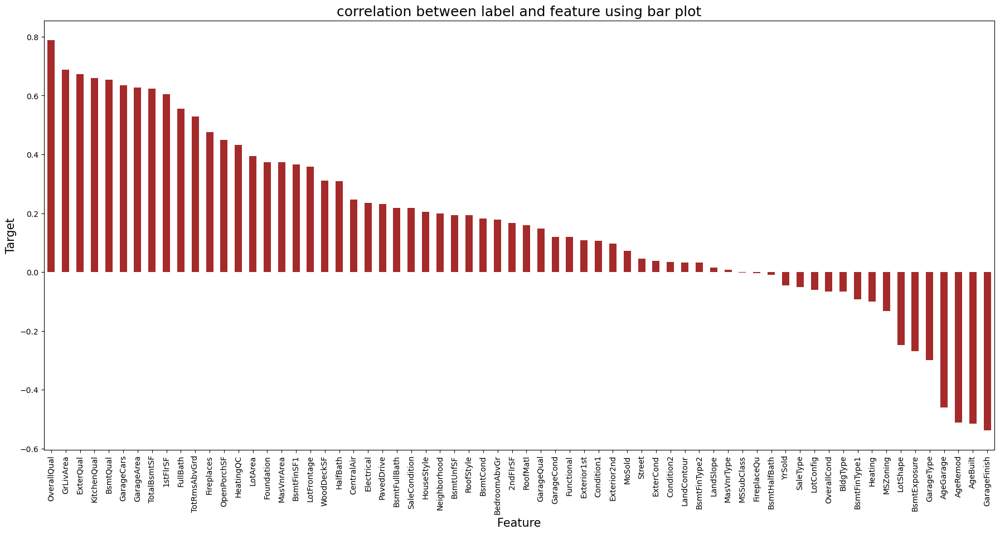

In [51]:
plt.figure(figsize=(22,10))
train_df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='brown')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

From the bar plot I can observe the columns MSSubClass and FirePlaceQu have very less correlation with the label. We can drop this columns if necessary. But for now keeping them as it is.

# Separating features and label

In [52]:
x = train_df.drop("SalePrice",axis=1)
y = train_df['SalePrice']

In [53]:
x.shape

(1168, 66)

In [54]:
y.shape

(1168,)

# Scaling Data using StandardScalar

In [55]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,-0.745155,0.310141,0.916764,0.067300,-0.11909,-1.178317,0.267506,0.299036,-0.570800,-0.871789,-1.281768,-0.838227,-0.238775,0.793082,-0.782707,-1.144966,-0.788838,-1.009429,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,-0.163806,0.101364,0.110393,0.291828,-0.960144,1.423871,-1.617822,-0.605487,0.330033,0.207932,-0.194636,0.382860,0.016145
1,-1.167999,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,1.032209,2.589114,0.852451,-0.832343,3.332324,-1.113129,-1.523529,-0.201793,-0.771186,1.042594,2.453434,-0.11909,0.903792,0.267506,0.299036,2.597841,-0.871789,1.377184,1.192995,-0.238775,0.793082,-0.782707,1.475072,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,0.717359,0.101364,0.110393,0.291828,0.783831,1.428474,1.361470,-0.605487,0.330033,0.207932,0.004170,0.671675,0.304955
2,0.490047,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.987463,-0.434828,1.000191,0.310141,-0.510359,0.165553,-0.11909,0.903792,0.267506,0.299036,-0.098819,1.177246,1.060650,1.192995,-0.238775,0.793082,1.268421,0.165053,-0.788838,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,-0.090782,0.101364,0.110393,0.291828,1.047285,1.208580,-0.128176,-0.605487,0.330033,0.207932,-0.857322,-0.627990,-0.809029
3,-1.167999,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-0.979178,0.630893,0.310141,1.178365,1.997087,-0.11909,0.903792,0.267506,0.299036,1.903610,-0.871789,0.775546,-0.838227,-0.238775,0.793082,-0.782707,0.165053,-0.788838,0.313788,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,0.352235,0.101364,0.110393,0.291828,-0.960144,1.178672,-1.990233,1.651563,-4.612004,0.207932,-0.128367,0.479132,0.139921
4,-1.167999,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,1.903443,0.310141,-0.230032,1.387415,-0.11909,-0.137262,0.267506,0.299036,1.227755,-0.871789,0.322952,-0.838227,4.188040,0.793082,-0.782707,0.165053,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,-1.524255,0.307737,0.269474,0.101364,0.110393,0.291828,1.139237,-1.062308,-0.128176,0.899213,0.330033,0.207932,-0.161501,-0.676126,0.098662


# PCA

In [56]:
#pca
from sklearn.decomposition import PCA
cover_matrix=PCA(n_components=len(x.columns))
cover_matrix.fit(x)

PCA(n_components=66)

In [57]:
pc=PCA(n_components=20)
x1=pc.fit_transform(x)
train_df_x=pd.DataFrame(x1)

In [58]:
train_df_x.shape

(1168, 20)

Now the training data has been cleaned and preprocessing of data has been done successfully. Lets build the ML Model now.

# Model Building

# Finding best random state

In [59]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(train_df_x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.9004356881818217  on Random_state  72


# Creating new train test split

In [60]:
x_train,x_test,y_train,y_test=train_test_split(train_df_x,y,test_size=.30,random_state=maxRS)

# Regression Algorithm

In [74]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso,Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

# Linear Regression

R2_score: 0.8176763159761927
MAE: 22210.516499512276
MSE: 1247984052.8474388
RMSE: 35326.81775715779
[0.79077872 0.83182544 0.78188816 0.78158497 0.71820765 0.83764851
 0.81953795 0.809018  ]
cross validation score:   0.7963111738815182
Difference between R2 score and cross validatio score is -  0.02136514209467455


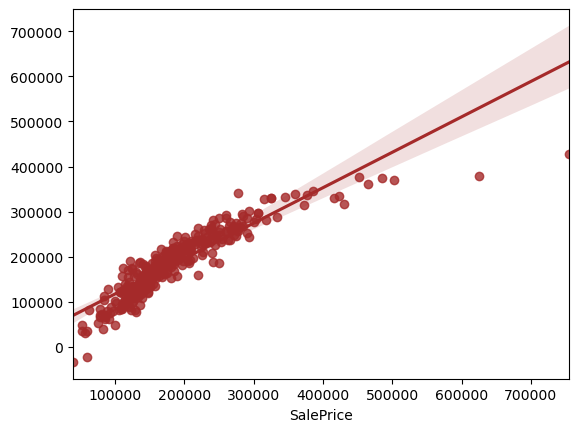

In [61]:
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))

# Mean Absolute Error (MAE)
print('MAE:',mean_absolute_error(y_test, predLR))

# Mean Squared Error (MSE)
print('MSE:',mean_squared_error(y_test, predLR))

# Root Mean Squared Error (RMSE)
print("RMSE:",np.sqrt(mean_squared_error(y_test, predLR)))

# Checking Cross Validation Score for Linear Regression
score=cross_val_score(LR,train_df_x,y,cv=8)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validatio score is - ",r2_score(y_test,predLR)-abs(score.mean()))

# Visualizing the predicteed values
sns.regplot(y_test,predLR,color="brown")
plt.show()

Created linear regression model and getting 81.76% R2 score with cross validation score 79.63%.

# Regularization


# Lasso Regressor

In [62]:
# Checking best alpha value
from sklearn.model_selection import GridSearchCV
parameters={'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
lasso=Lasso()
clf=GridSearchCV(lasso,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 100}


R2_Score: 0.8174911544427778
MAE: 22174.61604851989
MSE: 1249251461.643723
RMSE: 35344.75154310358
[0.80581153 0.77717552 0.73696972 0.8432424  0.80934927]
cross validation score:   0.7945096877232547
Difference between R2 score and cross validation score is -  0.022981466719523058


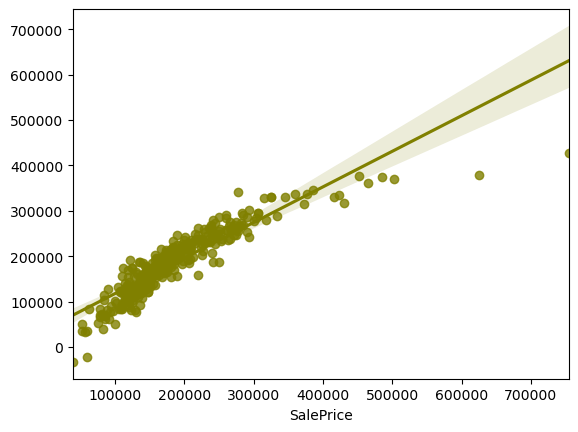

In [63]:
# Checking r2score for Lasso Regressor
lasso=Lasso(alpha=100)

# Predictions
lasso.fit(x_train,y_train)
lasso.score(x_train,y_train)
pred_lasso=lasso.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_lasso))
print('MAE:',mean_absolute_error(y_test, pred_lasso))
print('MSE:',mean_squared_error(y_test, pred_lasso))
print("RMSE:",np.sqrt(mean_squared_error(y_test, pred_lasso)))

# Checking cv score for Lasso Regression
score=cross_val_score(lasso,train_df_x,y,cv=5)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,pred_lasso)-abs(score.mean()))

# Visualizing the predicteed values
sns.regplot(y_test,pred_lasso,color="olive")
plt.show()

Created Lasso regressor model and getting 81.74% R2 score with cross validation score 79.45%

# Ridge Regressor

In [64]:
# Checking best alpha value
paramsRidge = {'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
ridge=Ridge()
clf=GridSearchCV(ridge,paramsRidge)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 100}


R2_Score: 0.8159872651690201
MAE: 21933.24588501036
MSE: 1259545405.8504055
RMSE: 35490.0747512654
[0.80449938 0.77705566 0.73921085 0.84148704 0.81581512]
cross validation score:   0.7956136097176673
Difference between R2 score and cross validation score is -  0.020373655451352835


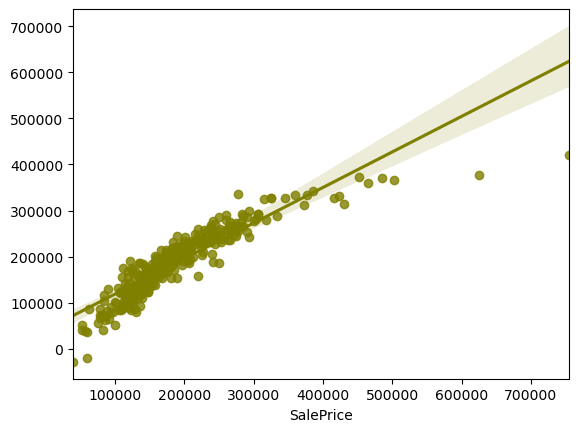

In [65]:
# Checking R2 score for Ridge regressor
ridge=Ridge(alpha=100)
ridge.fit(x_train,y_train)
ridge.score(x_train,y_train)
pred_ridge=ridge.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_ridge))
print('MAE:',mean_absolute_error(y_test, pred_ridge))
print('MSE:',mean_squared_error(y_test, pred_ridge))
print("RMSE:",np.sqrt(mean_squared_error(y_test, pred_ridge)))

# Checking cv score for Ridge Regression
score=cross_val_score(ridge,train_df_x,y,cv=5)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,pred_ridge)-abs(score.mean()))

# Visualizing the predicted values
sns.regplot(y_test,pred_ridge,color="olive")
plt.show()

Created Ridge regressor model and getting 81.59% R2 score with cross validation score 79.56%.

# Ensemble Techniques


# Random Forest Regressor

R2_score: 0.9011585839651556
MAE: 17915.00378917379
MSE: 676557802.3107411
RMSE: 26010.724755583822
[0.84015638 0.88110205 0.82441939 0.85396541 0.75157343 0.88800574
 0.84880439 0.85135559]
cross validation score:   0.8424227980100589
Difference between R2 score and cross validation score is -  0.05873578595509665


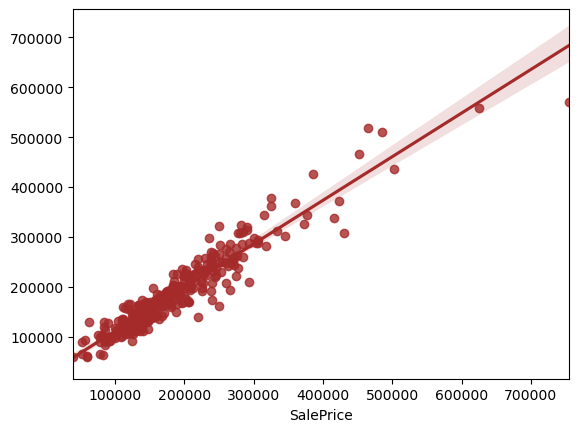

In [66]:
# Checking r2score for Random Forest Regressor
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_score:',r2_score(y_test,predRFR))

# Mean Absolute Error (MAE)
print('MAE:',mean_absolute_error(y_test, predRFR))

# Mean Squared Error (MSE)
print('MSE:',mean_squared_error(y_test, predRFR))

# Root Mean Squared Error (RMSE)
print("RMSE:",np.sqrt(mean_squared_error(y_test, predRFR)))

# Checking Cross Validation Score for Linear Regression
score=cross_val_score(RFR,train_df_x,y,cv=8)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,predRFR)-abs(score.mean()))

# Visualizing the predicted values
sns.regplot(y_test,predRFR,color="brown")
plt.show()A

Created Random Forest Regressor model and getting 90.11% R2 score with cross validation score 84.24%

# ExtraTrees Regressor

R2_Score: 0.9073097732448667
MAE: 16756.933076923076
MSE: 634453639.221741
RMSE: 25188.3631707529
[0.86627241 0.8450752  0.77867334 0.89721048 0.85867336]
cross validation score:   0.8491809595840433
Difference between R2 score and cross validation score is -  0.05812881366082345


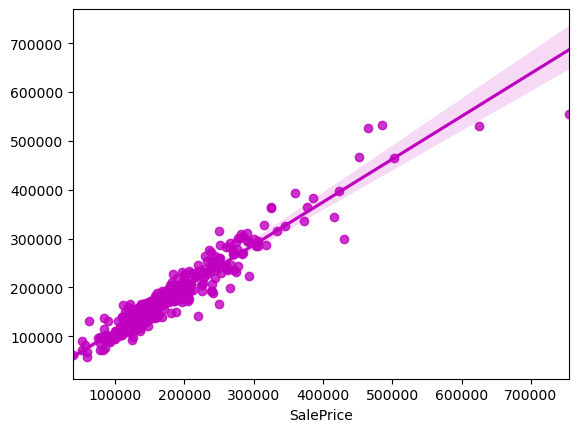

In [67]:
# Checking R2 score for Extra Trees Regressor

XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

# prediction
predXT=XT.predict(x_test)
print('R2_Score:',r2_score(y_test,predXT))

# Metric Evaluation
print('MAE:',mean_absolute_error(y_test, predXT))
print('MSE:',mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predXT)))

# Checking cv score for ExtraTreesRegressor
score=cross_val_score(XT,train_df_x,y,cv=5)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,predXT)-abs(score.mean()))

# Visualizing the predicteed values
sns.regplot(y_test,predXT,color="m")
plt.show()

Created ExtraTrees Regressor model and getting 90.57% R2 score with cross validation score 84.91%.

# GradientBoosting Regressor

R2_Score: 0.912504006109396
MAE: 17010.900302253063
MSE: 598899729.6108421
RMSE: 24472.427946790285
[0.84789121 0.83110214 0.79914066 0.89954756 0.8431074 ]
cross validation score:   0.844157793164978
Difference between R2 score and cross validation score is -  0.068346212944418


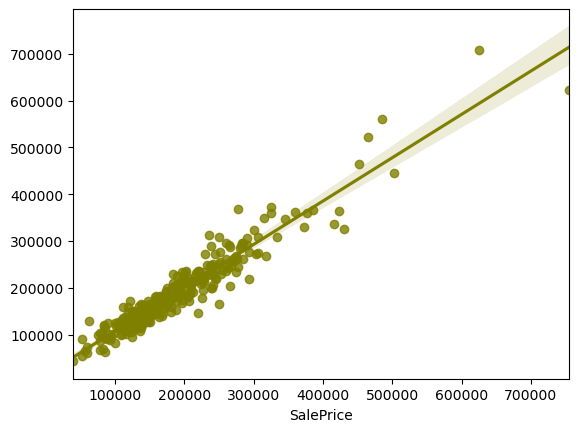

In [68]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
print('R2_Score:',r2_score(y_test,predGB))

# Metric Evaluation
print('MAE:',mean_absolute_error(y_test, predGB))
print('MSE:',mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predGB)))

# Checking cv score for Gradient Boosting Regressor
score=cross_val_score(GB,train_df_x,y,cv=5)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,predGB)-abs(score.mean()))

# Visualizing the predicteed values
sns.regplot(y_test,predGB,color="olive")
plt.show()

Created GradientBoosting Regressor model and getting 91.25% R2 score with cross validation score 84.41%

# BaggingRegressor

R2_Score: 0.8650190007044252
MAE: 20372.666381766383
MSE: 923928975.3288035
RMSE: 30396.200014620306
[0.81645986 0.80509343 0.7175875  0.86996015 0.82030088]
cross validation score:   0.8058803633081286
Difference between R2 score and cross validation score is -  0.059138637396296545


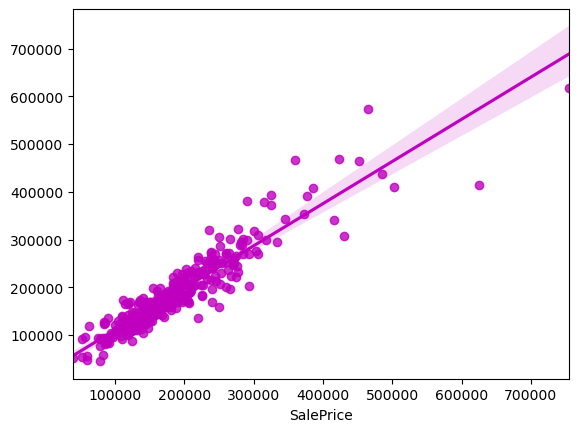

In [69]:
# Checking R2 score for BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))

# Metric Evaluation
print('MAE:',mean_absolute_error(y_test, predBR))
print('MSE:',mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predBR)))

# Checking cv score for BaggingRegressor
score=cross_val_score(BR,train_df_x,y,cv=5)
print(score)
print("cross validation score:  ",score.mean())
print("Difference between R2 score and cross validation score is - ",r2_score(y_test,predBR)-abs(score.mean()))


# Visualizing the predicteed values
sns.regplot(y_test,predBR,color="m")
plt.show()

Created Bagging Regressor model and getting 86.50% R2 score with cross validation score 80.58%


From the difference between R2 score and Cross Validation Score I can conclude that Random Forest Regressor as best fitting model as it is giving less difference compare to other models. Let's perform Hyperparameter tuning to increase the model accuracy.

# Hyper parameter tuning

In [70]:
# Lets use GridSearchCV to find the best parameters in Bagging Regressor
parameters = {'n_estimators': [10,50,100,200,500],
              'max_samples':[1.0,5.0,6.0,0.008],
              'max_features':[1.0,10.0,0.0001,5.68],
              'bootstrap':[True,False]}

In [71]:
GCV=GridSearchCV(RandomForestRegressor(),parameters,cv=5)

In [72]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'bootstrap': [True, False],
                         'max_features': [1.0, 10.0, 0.0001, 5.68],
                         'max_samples': [1.0, 5.0, 6.0, 0.008],
                         'n_estimators': [10, 50, 100, 200, 500]})

In [75]:
# Getting best parameters
GCV.best_params_

{'bootstrap': True,
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 50}

These are the best parameters obtained after tuning the model with hyperparameters.

R2_Score: 90.79657542800147
Mean absolute error: 17566.27743589743
Mean squared error: 629963526.6221732
Root Mean Squared error: 25099.07421842832


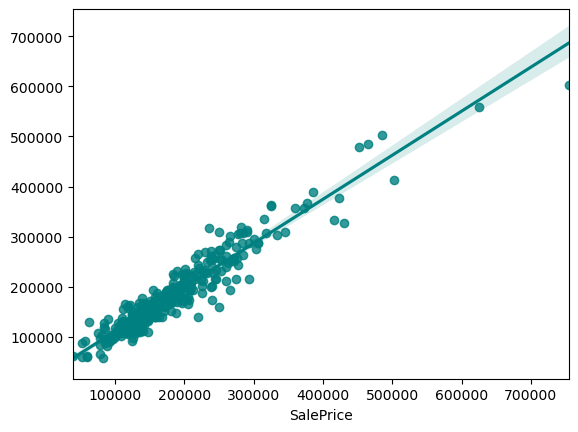

In [133]:
# Creating final model
Final_model = RandomForestRegressor(bootstrap=True, max_features=1.0, max_samples=1.0, n_estimators=50)

# Prediction
Final_model.fit(x_train, y_train)
pred = Final_model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)

# Metric Evaluation
print('Mean absolute error:',mean_absolute_error(y_test, pred))
print('Mean squared error:',mean_squared_error(y_test, pred))
print('Root Mean Squared error:',np.sqrt(mean_squared_error(y_test, pred)))

# Visualizing the predicteed values
sns.regplot(y_test,pred,color="teal")
plt.show()


Great!!! The R2 score of Random Forest Regressor has been increased after tuning the model. It is giving R2 score as 90.79% which is very good. The plot gives some strong linear between test and predicted values.

# Saving the final model

In [134]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model,"Housing_SalePrice_Prediction.pkl")

['Housing_SalePrice_Prediction.pkl']

# Predicting the saved model

In [135]:
# Loading the saved model
Model = joblib.load("Housing_SalePrice_Prediction.pkl")

# prediction
a = np.array(y_test)
predicted = np.array(Model.predict(x_test))
df_com = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_com

,Original,Predicted
0,139900,142089.00
1,107500,122943.50
2,52000,87622.00
3,152000,158613.04
4,124000,135193.16
5,193879,204308.16
6,119000,130179.00
7,119500,116499.32
8,132000,122028.68
9,159000,166122.64


# Prediction Visualization

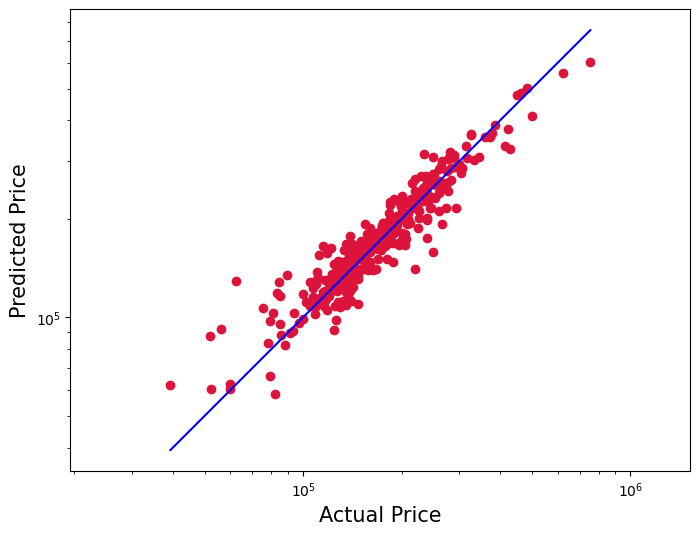

In [136]:
plt.figure(figsize=(8,6))
plt.scatter(y_test, predicted, c='crimson')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(predicted), max(y_test))
p2 = min(min(predicted), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual Price', fontsize=15)
plt.ylabel('Predicted Price', fontsize=15)
plt.axis('equal')
plt.show()

The plot gives the linear relation between predicted and actual sale price of the house. The best fitting line gives the actual values and red dots gives the predicted values.

# 2. Test Dataset


# Loading test dataset


In [137]:
# Reading test.csv file
test_df = pd.read_csv("C:/Users/hp/OneDrive/Documents/Project-Housing_splitted/test.csv")
test_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

This is the provided testing dataset. The test dataset contains only independent variables. It contains both numerical and categorical data values. We can also notice missing values in some of the columns.

# Preprocessing and EDA on test dataset.

In [138]:
# Checking the dimension of test dataset
test_df.shape

(292, 80)

The test dataset contains 292 rows and 80 columns. This test dataset contains only independent variables and there is no label.

In [139]:
# Checking the columns present in test dataset
test_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [140]:
# Checking the type of the test dataset
test_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


This testing dataset also comprises of both numerical and categorical data values i.e it is having int64, float and object datatype.

# Feature Engineering on test dataset

In [141]:
# Checking number of unique values in each column of test dataset
test_df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,2


Above are the number of unique values present in the columns of the test dataset.

Here also the column "Id" has no singnificance in the prediction. So I am going to remove it. The column "Utilities" also had been dropped in train dataset, so dropping the same column in test as well to keep the dimension of both the datasets same.

In [134]:
# Dropping irrelevant columns
test_df.drop("Id",axis=1,inplace=True)
test_df.drop("Utilities",axis=1,inplace=True)

# Value_count_function


In [142]:
# Checking the value counts of each columns of train dataset
for i in test_df.columns:
        print(test_df[i].value_counts())
        print('-'*100)

512     1
1352    1
1380    1
867     1
1378    1
1377    1
1293    1
1375    1
1371    1
858     1
855     1
1343    1
851     1
850     1
337     1
334     1
354     1
358     1
1190    1
328     1
377     1
388     1
386     1
385     1
1408    1
893     1
378     1
1400    1
365     1
1399    1
886     1
372     1
371     1
369     1
226     1
1354    1
1351    1
513     1
1350    1
1317    1
671     1
803     1
290     1
798     1
797     1
531     1
792     1
788     1
577     1
781     1
1292    1
265     1
776     1
775     1
807     1
296     1
134     1
314     1
866     1
834     1
523     1
831     1
217     1
1340    1
994     1
1362    1
312     1
823     1
1334    1
17      1
818     1
816     1
901     1
1193    1
391     1
1417    1
484     1
1160    1
482     1
481     1
989     1
988     1
472     1
541     1
469     1
1282    1
1431    1
973     1
1030    1
242     1
454     1
486     1
999     1
1000    1
1048    1
1017    1
766     1
33      1
1014    1
72      1


These are the value counts of the columns present in the test dataset.

Here also we can observe most of the columns contains maximum amount of zero values which is even not required for the prediction. The columns 'LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal' and 'BsmtFinSF2' have more than 90% zero values which is same as in the case of train dataset. So lets drop these columns.

# Handling Zero values

In [143]:
zero_value = pd.DataFrame(test_df.isin([0]).sum().sort_values(ascending=False))
zero_value.columns=['Count of Zero values']
zero_value['% of Zero values']=zero_value['Count of Zero values']/2.92     # 292/100 = 2.92
zero_value

,Count of Zero values,% of Zero values
PoolArea,292,100.000000
3SsnPorch,290,99.315068
LowQualFinSF,289,98.972603
MiscVal,282,96.575342
BsmtHalfBath,273,93.493151
ScreenPorch,271,92.808219
BsmtFinSF2,261,89.383562
EnclosedPorch,253,86.643836
HalfBath,189,64.726027
BsmtFullBath,170,58.219178


In [144]:
# Dropping the columns containing maximum amount(90%) of zero values
test_df.drop(columns = ['LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','BsmtFinSF2'],inplace = True)

# Handling Time variable in test dataset

In [145]:
# Let's subtract built year by year sold in order to get  the age
test_df["AgeBuilt"] = test_df.YrSold - test_df.YearBuilt
test_df["AgeRemod"] = test_df.YrSold - test_df.YearRemodAdd
test_df["AgeGarage"] = test_df.YrSold - test_df.GarageYrBlt

In [146]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as I have already got the required value from it.
test_df.drop("YearBuilt",axis=1,inplace=True)
test_df.drop("YearRemodAdd",axis=1,inplace=True)
test_df.drop("GarageYrBlt",axis=1,inplace=True)

In [147]:
test_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,2,1,2.0
1,25,25,25.0
2,8,8,8.0
3,68,59,68.0
4,1,1,1.0


Successfully got the age of the features.

# Checking null values in test dataset

In [148]:
# Displaying the columns containing null values count and their % i.e. ((count of null)/292)/100

test_null = pd.DataFrame(test_df[test_df.columns[test_df.isnull().any()]].isnull().sum())
test_null.columns=['Count of Null Values']
test_null['% of Null Values']=test_null['Count of Null Values']/2.92     # 292/100 = 11.68
test_null

,Count of Null Values,% of Null Values
LotFrontage,45,15.410959
Alley,278,95.205479
MasVnrType,1,0.342466
MasVnrArea,1,0.342466
BsmtQual,7,2.397260
BsmtCond,7,2.397260
BsmtExposure,7,2.397260
BsmtFinType1,7,2.397260
BsmtFinType2,7,2.397260
Electrical,1,0.342466


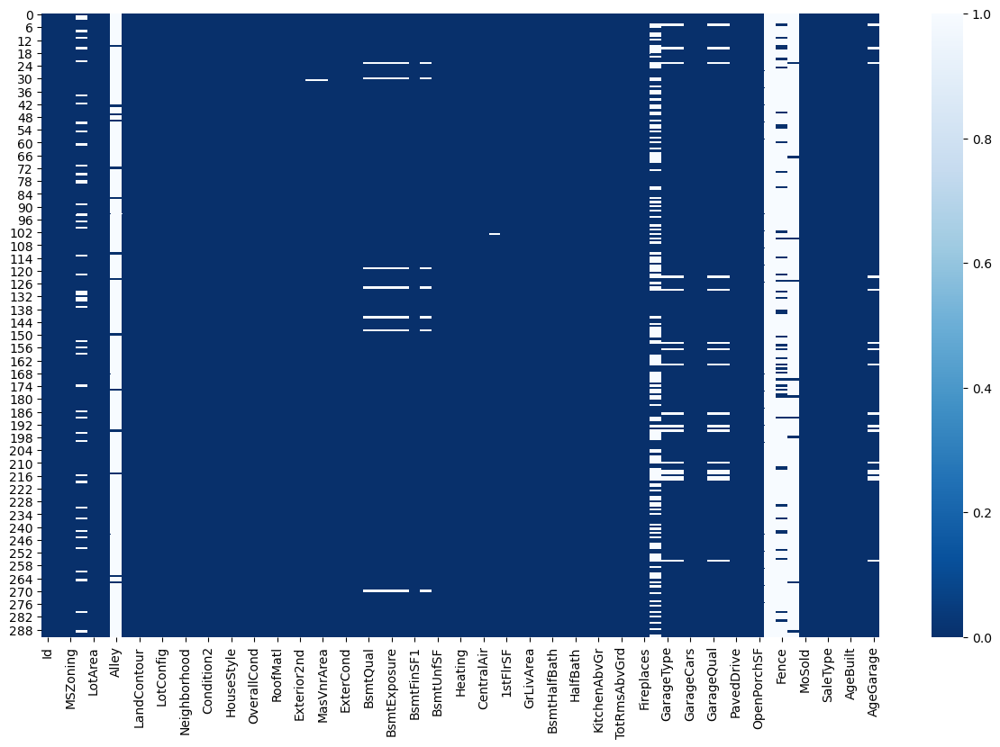

In [149]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(15,9))
sns.heatmap(test_df.isnull(), cmap="Blues_r")
plt.show()

In [150]:
# Dropping the columns containing more than 70% of the null values
test_df.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

# Treating null values

* The columns LotFrontage, MasVnrArea and GarageYrBlt are numerical in nature, let's fill the null values using mean values as there are no outliers present in these columns.
* The remaining columns seems to be categorical so filling the null values using mode method.

In [151]:
# Filling null values of object data column with their mode values (most frequently occurred values).

cols1=test_df.columns.values
for i in range(0,len(cols1)):
    if test_df[cols1[i]].dtype == "object":
        test_df[cols1[i]].fillna(test_df[cols1[i]].mode()[0], inplace=True)

In [152]:
# Filling null values of numerical columns with their mean values

cols2=test_df.columns.values
for i in range(0,len(cols2)):
    if test_df[cols2[i]].dtype != "object":
        test_df[cols2[i]].fillna(test_df[cols2[i]].mean(), inplace=True)

In [153]:
test_df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu 

Filled all the null values using mean and mode method. Hence there are no null values in any of the column. Let's visualize it using heat map.

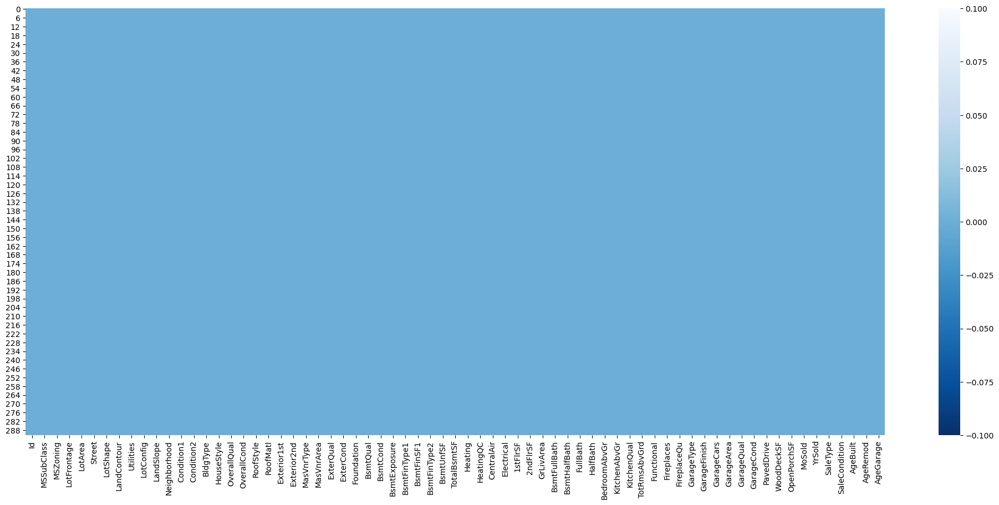

In [154]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(test_df.isnull(), cmap="Blues_r")
plt.show()

It is clear from the heat map that there are no null values in any of the column.

In [155]:
# Separating numerical and categorcal columns from test dataset

# Checking for categorical columns
categorical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]=='object':
        categorical_colte.append(i)
print("Categorical columns in test dataset are:\n",categorical_colte)
print("\n")

# Now checking for numerical columns
numerical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]!='object':
        numerical_colte.append(i)
print("Numerical columns in test dataset are:\n",numerical_colte)

Categorical columns in test dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in test dataset are:
 ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'A

# Description of Test dataset.

In [158]:
# Statistical summary of dataset
test_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,AgeBuilt,AgeRemod,AgeGarage
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,755.955479,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,339.657534,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,2007.859589,35.243151,22.565068,28.090909
std,442.565228,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,411.043768,424.561153,366.941919,424.278825,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,1.322867,30.494309,20.089470,23.145196
min,6.000000,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,0.000000
25%,377.750000,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,2007.000000,6.750000,4.000000,6.000000
50%,778.000000,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,2008.000000,32.000000,14.000000,28.090909
75%,1152.250000,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,717.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,2009.000000,53.250000,39.250000,42.000000
max,1456.000000,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,1589.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,2010.000000,136.000000,60.000000,90.000000


Similar to train dataset, here also we can observe the statistical information of test data.

# Identifying outliers

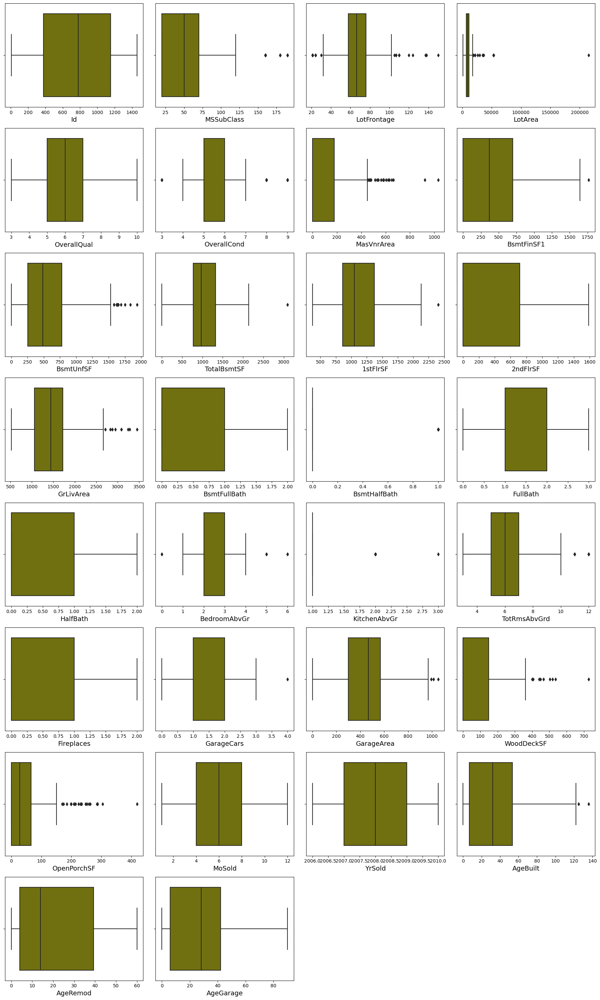

In [157]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_colte:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(test_df[column],color="olive")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

* Outliers present in all the columns except OverallQual, 2ndFlrSF,BsmtFullBath, FullBath, HalfBath, FirePlaces, MoSold, YrSold, AgeRemod and AgeGarage.
* The column OverallCond seems to be categorical so`, I am not removing outliers in this columns.

Let's remove the outliers in the remaining columns using both Zscore and IQR method and compare the dataloss.

# Removing outliers


# Zscore method

In [159]:
# Feature containing outliers
features = test_df[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'AgeBuilt']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

In [160]:
# Creating new dataframe
new_test_df = test_df[(z<3).all(axis=1)] 
new_test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,337,20,RL,86.000000,14157,Pave,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,2007,WD,Normal,2,1,2.0
1,1018,120,RL,66.425101,5814,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,2009,COD,Abnorml,25,25,25.0
2,929,20,RL,66.425101,11838,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,1753,1753,GasA,Ex,Y,SBrkr,1788,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,6,2009,WD,Normal,8,8,8.0
3,1148,70,RL,75.000000,12000,Pave,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,429,704,GasA,Ex,Y,SBrkr,860,704,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,Unf,1,234,TA,TA,Y,0,0,7,2009,WD,Normal,68,59,68.0
4,1227,60,RL,86.000000,14598,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,894,894,GasA,Ex,Y,SBrkr,894,1039,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,668,TA,TA,Y,100,18,1,2008,WD,Normal,1,1,1.0


In [164]:
# Checking the shape of dataset before and after removing outliers
print(test_df.shape)
print(new_test_df.shape)

(292, 69)
(234, 69)


In [165]:
# Checking the the data loss after removing outliers
loss = (292-234)/292*100
loss

19.863013698630137


By using Zscore I am losing around 19.86% of data which is not acceptable.

By using Zscore I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

In [166]:
# Removing outliers in train data using percentile method 
for col1 in features:
    if test_df[col1].dtypes != 'object':
        percentile = test_df[col1].quantile([0.01,0.98]).values
        test_df[col1][test_df[col1]<=percentile[0]]=percentile[0]
        test_df[col1][test_df[col1]>=percentile[1]]=percentile[1]

The outliers present in test dataset has been removed using percentile method.

# Checking for skewness in test dataset

In [167]:
# Checking the skewness
test_df.skew()

Id             -0.108806
MSSubClass      1.323471
LotFrontage    -0.017005
LotArea         1.200626
OverallQual     0.397312
OverallCond     1.209714
MasVnrArea      1.541920
BsmtFinSF1      0.639000
BsmtUnfSF       0.872685
TotalBsmtSF     0.148537
1stFlrSF        0.596622
2ndFlrSF        0.765511
GrLivArea       0.783807
BsmtFullBath    0.463685
BsmtHalfBath    3.544994
FullBath       -0.049800
HalfBath        0.758892
BedroomAbvGr   -0.345731
KitchenAbvGr    4.253608
TotRmsAbvGrd    0.627431
Fireplaces      0.540164
GarageCars     -0.356072
GarageArea      0.050014
WoodDeckSF      1.315315
OpenPorchSF     1.786468
MoSold          0.186504
YrSold          0.018412
AgeBuilt        0.621096
AgeRemod        0.533693
AgeGarage       0.678577
dtype: float64

Since OverallCond is categorical so no need to remove skewness in this columns. Let's remove skewenss present in the remaining columns.

# Removing skewness using Yeo-johnson method

In [168]:
# Removing skewness using yeo-johnson method to get better prediction
skew2 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","1stFlrSF","2ndFlrSF","GrLivArea","BsmtHalfBath","HalfBath","KitchenAbvGr","TotRmsAbvGrd","Fireplaces","WoodDeckSF","OpenPorchSF","AgeBuilt","AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [169]:
test_df[skew2] = scaler.fit_transform(test_df[skew2].values)
test_df[skew2].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,AgeBuilt,AgeGarage
0,-1.149822,1.019088,1.184689,1.212880,0.459558,1.830429,-0.870294,0.966988,-0.263813,-0.738058,0.0,0.981907,0.808861,1.121319,0.720379,-1.417256,-1.398277
1,1.341197,-0.881870,-0.846663,1.071263,-0.847856,0.749066,-0.870294,-0.084205,-0.263813,-0.738058,0.0,-1.613568,0.808861,0.815069,-1.112321,-0.008614,0.159148
2,-1.149822,0.567715,-0.846663,-1.376644,1.998151,1.606277,-0.870294,0.745019,-0.263813,-0.738058,0.0,0.449228,0.808861,1.156161,1.287938,-0.831088,-0.763392
3,0.706032,0.600638,-0.846663,0.236007,-0.094685,-0.717491,1.137231,0.337169,-0.263813,1.349285,0.0,0.449228,0.808861,-0.913784,-1.112321,1.067289,1.406311
4,0.507373,1.100536,0.953995,-1.376644,0.880263,-0.591915,1.211129,0.984569,-0.263813,1.349285,0.0,1.463878,0.808861,0.955773,0.216281,-1.583108,-1.573401


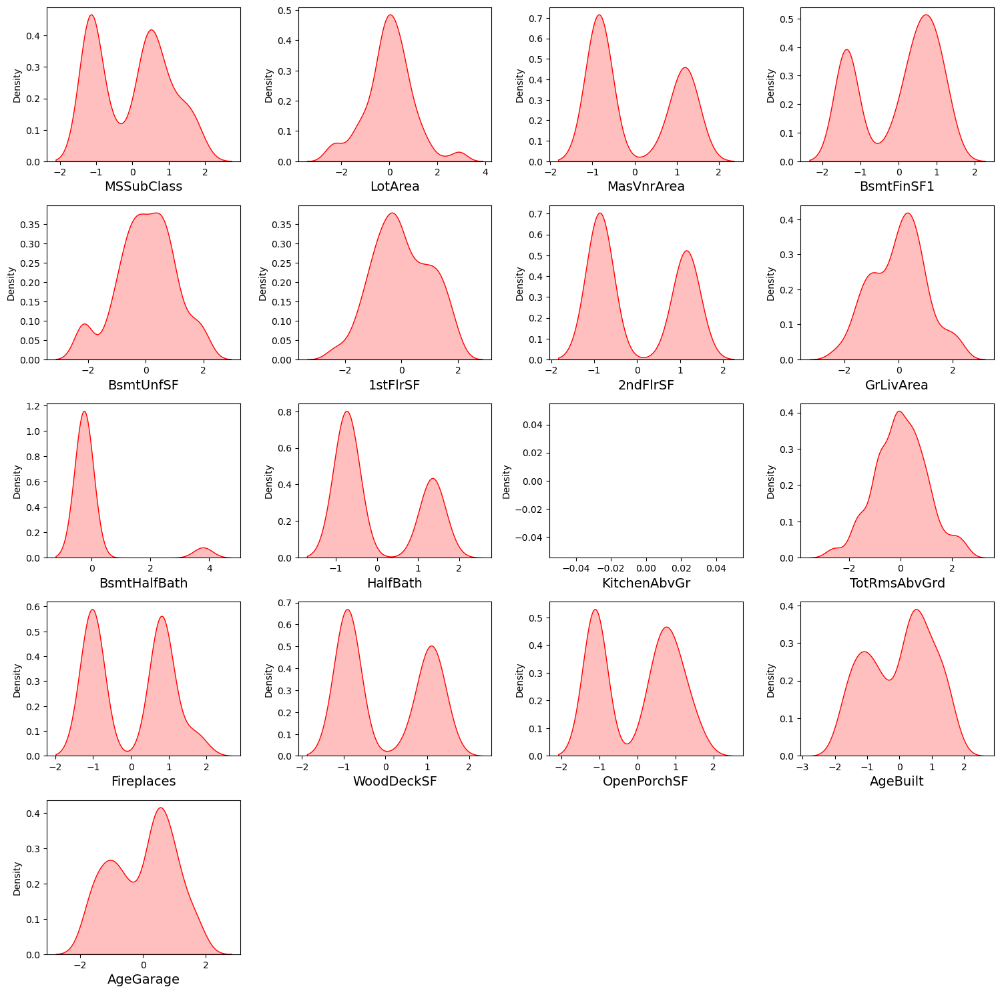

In [170]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in test_df[skew2] :
    if plotnumber<=17:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(test_df[column],color="r",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [171]:
# Checking skewness after using yeo-johnson method
test_df[skew2].skew()

MSSubClass      0.088585
LotArea         0.072782
MasVnrArea      0.362274
BsmtFinSF1     -0.447509
BsmtUnfSF      -0.247953
1stFlrSF        0.004128
2ndFlrSF        0.284246
GrLivArea      -0.003223
BsmtHalfBath    3.544994
HalfBath        0.621093
KitchenAbvGr    0.000000
TotRmsAbvGrd    0.000698
Fireplaces      0.076669
WoodDeckSF      0.208523
OpenPorchSF    -0.065216
AgeBuilt       -0.190741
AgeGarage      -0.186322
dtype: float64

* We can observe the skewness has almost been reduced in all the columns.
* The column KitchenAbvGr has skewness zero which means it contains only one unique value that is zero throughout the dataset, So lets drop this column as well.

In [172]:
test_df.drop("KitchenAbvGr",axis=1,inplace=True)

In [186]:
test_df.drop("Id",axis=1,inplace=True)

In [198]:
test_df.drop("1stFlrSF",axis=1,inplace=True)

# Encoding Test DataFrame

In [187]:
# Replacing ratings by numbers on the basis of specific condition
columns = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in columns:
    test_df[i] = test_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [199]:
# Encoding test dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in test_df.columns:
    if test_df[i].dtypes == "object":
        test_df[i] = enc.fit_transform(test_df[i].values.reshape(-1,1))

In [200]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,-0.287006,1.067625,1.019088,0.083045,-1.402669,-2.566101,-0.058621,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.184689,1.137790,-0.299447,0.776109,2.077301,-0.045376,-1.192678,-0.377559,1.212880,0.296045,0.459558,2.183452,-0.141879,0.842032,0.248633,0.312609,-0.870294,0.966988,1.132656,-0.263813,0.776457,-0.738058,0.307995,0.816613,0.981907,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.709952,1.059062,0.078757,0.088121,0.281378,1.121319,0.720379,0.276960,-0.650908,0.23029,0.148654,-1.417256,-1.075294,-1.398277
1,1.341197,-0.287006,0.021774,-0.881870,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846663,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-2.090260,-0.377559,1.071263,0.296045,-0.847856,0.451631,-0.141879,-0.208709,0.248633,0.312609,-0.870294,-0.084205,1.132656,-0.263813,-1.051974,-0.738058,-2.459219,0.816613,-1.613568,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.367732,0.524080,0.078757,0.088121,0.281378,0.815069,-1.112321,0.637997,0.863555,-6.49418,-3.323909,-0.008614,0.121412,0.159148
2,-1.149822,-0.287006,0.021774,0.567715,0.083045,0.745474,0.299297,-0.058621,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846663,1.137790,-0.299447,0.776109,0.619196,-0.045376,-2.090260,1.284459,-1.376644,0.296045,1.998151,1.766532,-0.141879,0.842032,0.248633,0.312609,-0.870294,0.745019,-0.836008,-0.263813,0.776457,-0.738058,0.307995,2.335408,0.449228,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.367732,0.316834,0.078757,0.088121,0.281378,1.156161,1.287938,-0.084077,0.863555,0.23029,0.148654,-0.831088,-0.726255,-0.763392
3,0.706032,-0.287006,0.479915,0.600638,0.083045,0.745474,-3.998799,-0.058621,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,0.355435,-0.846663,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.602487,0.730453,0.236007,0.296045,-0.094685,-0.821332,-0.141879,0.842032,0.248633,0.312609,1.137231,0.337169,-0.836008,-0.263813,-1.051974,1.349285,0.307995,-2.220978,0.449228,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.974489,-1.071228,0.078757,0.088121,0.281378,-0.913784,-1.112321,0.276960,0.863555,0.23029,0.148654,1.067289,1.816747,1.406311
4,0.507373,-0.287006,1.067625,1.100536,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,1.952161,0.953995,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.295096,1.284459,-1.376644,0.296045,0.880263,-0.352606,-0.141879,0.842032,0.248633,0.312609,1.211129,0.984569,-0.836008,-0.263813,0.776457,1.349285,1.691601,0.816613,1.463878,0.22482,0.808861,0.487877,0.497067,-1.474589,1.709952,1.020505,0.078757,0.088121,0.281378,0.955773,0.216281,-1.889261,0.106324,0.23029,0.148654,-1.583108,-1.075294,-1.573401


We have encoded object data types into numerical using OrdinalEncoder method.

# Checking correlation between the features in test data

In [201]:
# Checking the correlation between features
cor1 = test_df.corr()
cor1

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.230922,-0.373908,-0.387109,0.005665,0.126507,0.013631,-0.067404,0.013514,-0.062158,-0.093560,0.060330,-0.028565,0.641508,0.499602,-0.068933,-0.034187,-0.243385,-0.003546,-0.029276,-0.118860,-0.108053,0.000175,-0.044504,-0.081128,0.055058,0.070922,0.040575,-0.027770,0.096357,-0.147259,0.064315,-0.146849,-0.382045,0.043193,-0.070985,-0.066447,0.060709,0.593826,0.176997,-0.062961,-0.039289,0.148119,0.345263,0.030151,-0.134077,0.100772,-0.070135,-0.003696,-0.105648,0.167402,0.018028,-0.053219,-0.089639,0.008007,-0.016228,-0.018566,0.066203,-0.083751,0.027774,0.022935,-0.090847,-0.043731,0.009146,0.027770,-0.038829
MSZoning,0.230922,1.000000,-0.351480,-0.334873,-0.063162,0.167716,-0.099137,-0.016825,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,0.010358,-0.125282,-0.327079,0.065494,-0.195382,-0.219848,-0.139784,0.050552,0.038716,-0.139952,-0.015825,-0.139826,-0.279148,0.094397,-0.225763,-0.235065,-0.035888,0.017233,-0.209533,-0.084559,-0.017534,-0.236326,-0.181873,-0.120083,-0.266916,-0.150258,-0.131738,-0.169600,0.050584,0.142661,0.233188,-0.308576,-0.307008,-0.087401,-0.067022,-0.236680,-0.101959,-0.186660,0.074308,-0.072716,0.123993,0.005290,0.350315,0.154700,0.282159
LotFrontage,-0.373908,-0.351480,1.000000,0.589343,-0.062040,-0.137329,-0.062143,0.001276,-0.128053,0.121853,0.190659,0.063261,-0.018847,-0.455486,-0.069730,0.270539,-0.105705,0.195909,0.084083,0.050653,0.058110,0.046939,0.130869,0.198226,-0.076662,0.147518,0.173670,0.047516,-0.113060,0.008967,0.089141,-0.093740,0.170755,0.382499,-0.011848,0.112876,0.028364,0.014873,-0.077306,0.353152,0.075401,-0.041809,0.219694,0.039841,0.247313,0.181581,0.331847,0.034426,0.253007,-0.009986,-0.240542,-0.315188,0.331935,0.349301,0.061087,0.034276,0.075489,0.027840,0.077149,-0.040921,0.053027,0.032145,0.036364,-0.165903,-0.056636,-0.139324
LotArea,-0.387109,-0.334873,0.589343,1.000000,-0.114132,-0.314583,-0.132524,0.062110,-0.159081,0.387173,0.167684,0.071153,-0.043121,-0.567111,-0.044479,0.223035,-0.105341,0.238482,0.036861,0.071019,0.072086,-0.022562,0.098291,0.191721,-0.026126,0.088095,0.129281,0.042360,-0.190806,0.006901,0.141839,0.000985,0.119453,0.402745,0.015647,0.069796,0.082520,0.006613,-0.019403,0.426403,0.124966,0.082199,0.226127,0.117328,0.348866,0.160634,0.412654,0.043609,0.311008,0.023367,-0.211960,-0.261484,0.362365,0.374843,0.033120,-0.036661,-0.022769,0.125641,0.157678,-0.063063,0.000215,0.071125,0.062735,-0.101666,-0.075326,-0.072700
Street,0.005665,-0.063162,-0.062040,-0.114132,1.000000,-0.002444,0.153613,0.004868,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,0.036783,-0.015088,0.128016,0.024868,0.043091,0.009123,0.003768,0.099047,-0.037657,-0.038772,0.110019,0.095219,-0.032179,0.011782,0.060962,0.156680,-0.025961,0.072274,0.051213,-0.094062,0.021908,0.087362,-0.025380,0.031874,0.058313,0.068524,-0.018670,-0.027697,0.033426,0.006743,-0.029487,-0.086271,-0.106414,-0.006540,-0.007318,-0.023367,-0.002459,-0.018983,0.036965,-0.040272,-0.019125,-0.012345,-0.048804,-0.094971,-0.070219
LotShape,0.126507,0.167716,-0.137329,-0.314583,-0.002444,1.000000,0.100105,-0.082226,0.262901,-0.094606,-0.067832,-0.02

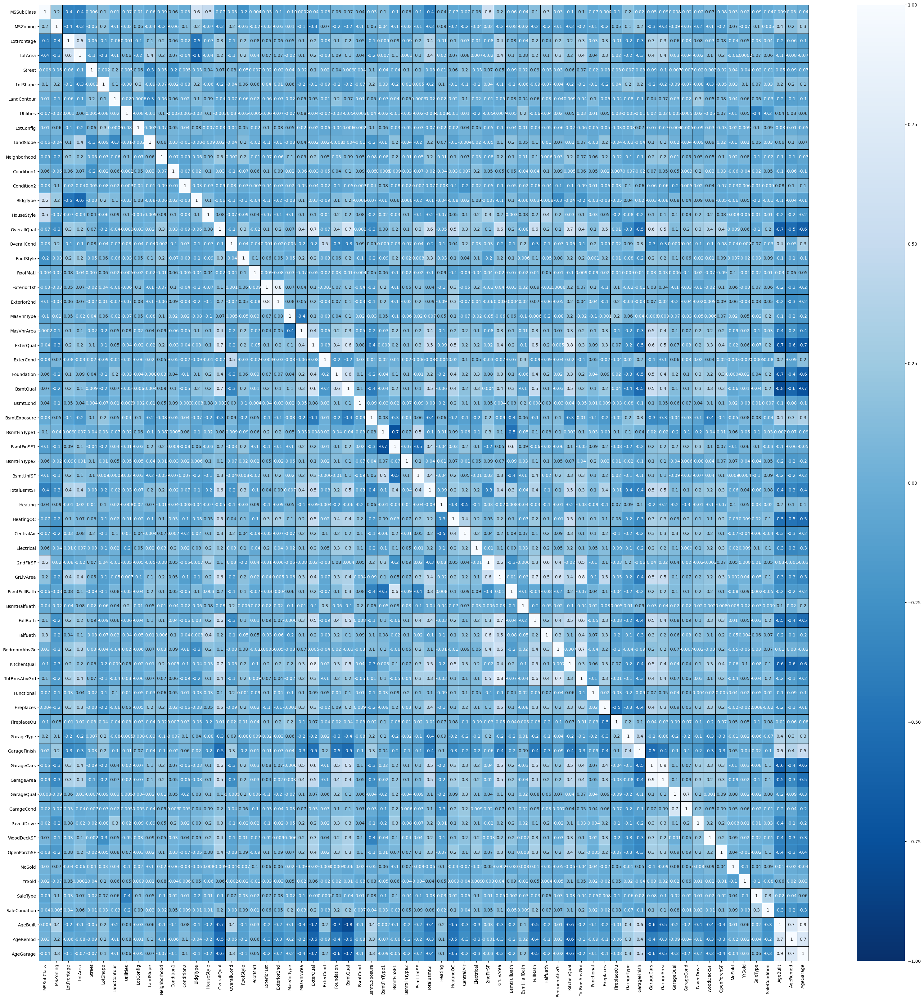

In [202]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))    
sns.heatmap(test_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="Blues_r")
plt.yticks(rotation=0);

# Scaling Test data using StandardScaler

In [204]:
# Scaling data
scaler = StandardScaler()
test_df = pd.DataFrame(scaler.fit_transform(test_df), columns=test_df.columns)
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,-0.287006,1.067625,1.019088,0.083045,-1.402669,-2.566101,-0.058621,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.184689,1.137790,-0.299447,0.776109,2.077301,-0.045376,-1.192678,-0.377559,1.212880,0.296045,0.459558,2.183452,-0.141879,0.842032,0.248633,0.312609,-0.870294,0.966988,1.132656,-0.263813,0.776457,-0.738058,0.307995,0.816613,0.981907,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.709952,1.059062,0.078757,0.088121,0.281378,1.121319,0.720379,0.276960,-0.650908,0.23029,0.148654,-1.417256,-1.075294,-1.398277
1,1.341197,-0.287006,0.021774,-0.881870,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846663,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-2.090260,-0.377559,1.071263,0.296045,-0.847856,0.451631,-0.141879,-0.208709,0.248633,0.312609,-0.870294,-0.084205,1.132656,-0.263813,-1.051974,-0.738058,-2.459219,0.816613,-1.613568,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.367732,0.524080,0.078757,0.088121,0.281378,0.815069,-1.112321,0.637997,0.863555,-6.49418,-3.323909,-0.008614,0.121412,0.159148
2,-1.149822,-0.287006,0.021774,0.567715,0.083045,0.745474,0.299297,-0.058621,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846663,1.137790,-0.299447,0.776109,0.619196,-0.045376,-2.090260,1.284459,-1.376644,0.296045,1.998151,1.766532,-0.141879,0.842032,0.248633,0.312609,-0.870294,0.745019,-0.836008,-0.263813,0.776457,-0.738058,0.307995,2.335408,0.449228,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.367732,0.316834,0.078757,0.088121,0.281378,1.156161,1.287938,-0.084077,0.863555,0.23029,0.148654,-0.831088,-0.726255,-0.763392
3,0.706032,-0.287006,0.479915,0.600638,0.083045,0.745474,-3.998799,-0.058621,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,0.355435,-0.846663,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.602487,0.730453,0.236007,0.296045,-0.094685,-0.821332,-0.141879,0.842032,0.248633,0.312609,1.137231,0.337169,-0.836008,-0.263813,-1.051974,1.349285,0.307995,-2.220978,0.449228,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.974489,-1.071228,0.078757,0.088121,0.281378,-0.913784,-1.112321,0.276960,0.863555,0.23029,0.148654,1.067289,1.816747,1.406311
4,0.507373,-0.287006,1.067625,1.100536,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,1.952161,0.953995,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.295096,1.284459,-1.376644,0.296045,0.880263,-0.352606,-0.141879,0.842032,0.248633,0.312609,1.211129,0.984569,-0.836008,-0.263813,0.776457,1.349285,1.691601,0.816613,1.463878,0.22482,0.808861,0.487877,0.497067,-1.474589,1.709952,1.020505,0.078757,0.088121,0.281378,0.955773,0.216281,-1.889261,0.106324,0.23029,0.148654,-1.583108,-1.075294,-1.573401


We have scaled the data using StandardScaler method to overcome with the issue of data biasness.

# PCA for test dataset

In [205]:
#pca
from sklearn.decomposition import PCA
cover_matrix=PCA(n_components=len(test_df.columns))
cover_matrix.fit(test_df)

PCA(n_components=66)

In [206]:
pc=PCA(n_components=20)
x1=pc.fit_transform(test_df)
test_df_x=pd.DataFrame(x1)

In [207]:
test_df_x.shape

(292, 20)

In [208]:
test_df_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,6.320572,-1.761757,2.014100,1.848100,0.810900,-0.138150,0.858399,-0.284563,-0.988054,-0.332691,-1.077448,0.981537,0.716005,-0.959854,-0.073178,-0.178955,0.871157,0.049771,0.083699,1.293183
1,0.725399,-3.781807,-1.277387,-1.379790,0.885638,5.761072,1.991711,2.550315,-2.257047,-0.605681,-1.831807,0.408716,1.816911,-0.492695,-1.061744,0.948366,1.988079,0.160474,0.582877,-2.155756
2,3.970955,0.347641,0.147409,3.027289,-0.144581,0.594572,-0.158431,-1.593689,0.838719,0.145184,-0.886692,-0.887075,0.324747,1.585913,0.057068,0.016656,-0.031797,0.095321,0.381755,-0.662117
3,-2.752668,2.327522,1.123221,-1.164980,-1.060319,-1.260263,0.308393,-0.093403,-0.619898,0.582216,-1.256153,-0.563705,0.017331,-1.046984,-1.346127,0.147639,-0.628025,0.707964,0.702173,0.315035
4,4.615290,3.127132,-0.161865,0.712576,-0.297388,0.260667,0.540232,1.514797,-0.424481,-1.000621,-0.312895,-0.403236,-0.347359,-1.343150,0.005535,0.136005,-0.349641,0.661716,0.357349,0.824932


So we have successfully cleaned and preprocesed testing data. Lets use this dataset for testing the saved trained model.

# Predicting SalePrice of the house for test dataset using saved trained model

In [212]:
# Predicting the house sale price from the features of the testing data 
Predicted_SalePrice = Model.predict(test_df_x)
Predicted_SalePrice

array([ 66766.44, 168418.7 , 110784.76, 208069.88, 109689.76, 385838.62,
       212986.44,  93808.  , 111800.78, 184594.48, 516251.78, 200036.66,
       217179.2 , 146140.  ,  72741.44, 235516.4 , 278206.34, 257213.7 ,
       139419.  , 148060.  , 215852.16, 157399.04, 174046.6 , 319584.4 ,
       274646.58, 204427.84, 169785.  , 184748.98, 147146.  , 326158.12,
       187094.74, 137532.  , 120767.16, 162447.54, 275417.2 , 168215.  ,
       135464.5 , 231310.34, 171779.  , 205230.38, 290235.9 , 102729.8 ,
       146867.  , 139306.  , 170129.  , 253010.46, 271024.36, 376715.84,
       135703.68,  76741.18, 193073.66, 133063.04, 294311.88, 358436.64,
       107850.36, 235281.84, 229106.98, 151535.  , 239433.52, 113023.56,
       252003.62, 162847.  , 209208.44, 202533.92, 133188.  , 259224.66,
       160427.  , 132411.18, 183068.66, 178459.28, 105210.44, 185853.04,
       203239.  , 192842.9 , 188325.4 , 133786.  ,  97881.16, 143364.  ,
        96539.64, 176060.3 , 113621.72, 264158.96, 

# Creating DataFrame and saving the predictions

In [213]:
#Creating DataFrame for the predicted results
Prediction = pd.DataFrame()
Prediction['SalePrice'] = Predicted_SalePrice
Prediction

,SalePrice
0,66766.44
1,168418.70
2,110784.76
3,208069.88
4,109689.76
5,385838.62
6,212986.44
7,93808.00
8,111800.78
9,184594.48


In [214]:
# Saving the Predictions in csv file
Prediction.to_csv("Predicted_House_SalePrice.csv")

# Conclusion

# Which variables are important to predict the price of the house?

* Overall Quality is the most contributing and highest positive impacting feature. Also, the features like GarageArea, LotArea, 1stFlrSF, TotalBsmtSF, etc have some what linear relation with the price variable.

# How do these variables describe the price of the house?


* The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we have observed from the plot that as the overall quality of the house increases,the sale price also increases. That is there is good linear relation between SalePrice and OverallQual. So, if the seller builds the house according to these types of qualities that will increase the sale price of the house.
* There is a linear relation between the SalePrice and 1stFlrSF. As we have seen as the 1st floor area increases, sales price also increases moderately. So, people like to live in the houses which have only 1-2 floors and the cost of the house also increases in this case.
* Also, we have seen the positive linear relation between the SalePrice and GarageArea. As size of garage area increases, sale price also increases.
* There is positive linear relation between sale price nad TotalBsmtSF. As total basement area increases, sale price also increases.
* Uisng the features which have some relation with target we have built many ML models also seen the increase in accuracy of the best model.

#                                                Thank You!🏡                                                  